# AtmoPollution

In [1]:
import pandas as pd
import pickle as pkl
import seaborn as sns
import numpy as np

import statsmodels.formula.api as smf
import statsmodels.api as sm
from summarytools import dfSummary

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import f_regression

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

with open('feinstaubdataexercise.pickle', 'rb') as file:
    dailymeansdata = pkl.load(file)
    
print(dailymeansdata)
dailymeansdata["Graz-DB"].head()

{'Graz-DB':                                  day_type   humidity      temp        no2  \
DateTime                                                                    
2015-01-01 00:00:00+00:00  Sunday/Holiday  76.086280 -3.114223  55.883530   
2015-01-02 00:00:00+00:00         Weekday  84.450230  0.345273  82.513820   
2015-01-03 00:00:00+00:00        Saturday  89.667440  1.184227  65.594920   
2015-01-04 00:00:00+00:00  Sunday/Holiday  61.433243  3.666447  21.547293   
2015-01-05 00:00:00+00:00         Weekday  72.254745  2.146478  40.342360   
...                                   ...        ...       ...        ...   
2020-12-27 00:00:00+00:00  Sunday/Holiday  80.488220 -2.868204  27.720545   
2020-12-28 00:00:00+00:00         Weekday  90.744225 -0.705294  36.626446   
2020-12-29 00:00:00+00:00         Weekday  92.967810  1.020848  45.060910   
2020-12-30 00:00:00+00:00         Weekday  93.184120  2.721566  41.690440   
2020-12-31 00:00:00+00:00         Weekday  89.811880  2.041227  

,day_type,humidity,temp,no2,pm10,prec,windspeed,peak_velocity
DateTime,,,,,,,,
2015-01-01 00:00:00+00:00,Sunday/Holiday,76.086280,-3.114223,55.883530,113.757540,0.000000,0.285276,1.587069
2015-01-02 00:00:00+00:00,Weekday,84.450230,0.345273,82.513820,94.340850,0.000000,0.184891,2.116092
2015-01-03 00:00:00+00:00,Saturday,89.667440,1.184227,65.594920,58.921513,0.000000,0.298194,2.997797
2015-01-04 00:00:00+00:00,Sunday/Holiday,61.433243,3.666447,21.547293,19.053576,2.472168,1.427332,13.225575
2015-01-05 00:00:00+00:00,Weekday,72.254745,2.146478,40.342360,14.491992,0.998253,1.079748,9.698755


# 1. Untersuchen Sie die Zusammenhänge der einzelnen Prädiktoren mit den beiden responses. In welchen Bereichen befinden sich die Daten? Wie sehen die Daten über die Zeit verteilt aus? Gibt es missing data? Erstellen Sie aussagekräftige Plots und machen Sie sich ein Bild über die Datenlage.

In [2]:
data = dailymeansdata["Graz-DB"]
data.head()

,day_type,humidity,temp,no2,pm10,prec,windspeed,peak_velocity
DateTime,,,,,,,,
2015-01-01 00:00:00+00:00,Sunday/Holiday,76.086280,-3.114223,55.883530,113.757540,0.000000,0.285276,1.587069
2015-01-02 00:00:00+00:00,Weekday,84.450230,0.345273,82.513820,94.340850,0.000000,0.184891,2.116092
2015-01-03 00:00:00+00:00,Saturday,89.667440,1.184227,65.594920,58.921513,0.000000,0.298194,2.997797
2015-01-04 00:00:00+00:00,Sunday/Holiday,61.433243,3.666447,21.547293,19.053576,2.472168,1.427332,13.225575
2015-01-05 00:00:00+00:00,Weekday,72.254745,2.146478,40.342360,14.491992,0.998253,1.079748,9.698755


In [3]:
data.to_csv('dataall.csv', index=True)

In [4]:
print(data.index)

DatetimeIndex(['2015-01-01 00:00:00+00:00', '2015-01-02 00:00:00+00:00',
               '2015-01-03 00:00:00+00:00', '2015-01-04 00:00:00+00:00',
               '2015-01-05 00:00:00+00:00', '2015-01-06 00:00:00+00:00',
               '2015-01-07 00:00:00+00:00', '2015-01-08 00:00:00+00:00',
               '2015-01-09 00:00:00+00:00', '2015-01-10 00:00:00+00:00',
               ...
               '2020-12-22 00:00:00+00:00', '2020-12-23 00:00:00+00:00',
               '2020-12-24 00:00:00+00:00', '2020-12-25 00:00:00+00:00',
               '2020-12-26 00:00:00+00:00', '2020-12-27 00:00:00+00:00',
               '2020-12-28 00:00:00+00:00', '2020-12-29 00:00:00+00:00',
               '2020-12-30 00:00:00+00:00', '2020-12-31 00:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='DateTime', length=2161, freq=None)


In [5]:
# Verwenden Sie zur Modellbildung ausschließlich die Daten aus 2015 – 2019

data1519 = data[data.index.year != 2020]
data1519.tail()

,day_type,humidity,temp,no2,pm10,prec,windspeed,peak_velocity
DateTime,,,,,,,,
2019-12-27 00:00:00+00:00,Weekday,88.978780,1.669536,47.676907,18.317930,0.197115,0.404630,2.645115
2019-12-28 00:00:00+00:00,Saturday,53.859238,1.897964,26.288273,11.508529,0.000000,1.091225,8.817050
2019-12-29 00:00:00+00:00,Sunday/Holiday,64.601600,-1.364513,35.675564,20.209654,0.000000,0.518293,6.700958
2019-12-30 00:00:00+00:00,Weekday,76.219124,-2.257874,51.466297,40.384453,0.000000,0.399608,2.292433
2019-12-31 00:00:00+00:00,Weekday,75.055660,2.199772,57.068943,55.679170,0.000000,0.242542,2.027922


## Gibt es missing data?

In [6]:
rows_with_na = data1519[data1519.isna().any(axis=1)]
print(rows_with_na)

                          day_type   humidity       temp        no2  \
DateTime                                                              
2015-06-29 00:00:00+00:00  Weekday  63.479115  18.813822  38.872180   
2015-06-30 00:00:00+00:00  Weekday  67.492770  20.877440  37.622490   
2016-10-17 00:00:00+00:00  Weekday  85.169820  13.786567  40.221878   
2016-10-18 00:00:00+00:00  Weekday  93.783300   9.618448  24.532623   
2016-10-19 00:00:00+00:00  Weekday  92.930450   8.665779  27.888947   
2016-10-20 00:00:00+00:00  Weekday  91.655174   6.887677  46.994686   
2017-07-25 00:00:00+00:00  Weekday  57.978317  18.770864        NaN   
2017-10-24 00:00:00+00:00  Weekday  53.386494  11.998291  35.670430   
2018-04-03 00:00:00+00:00  Weekday  46.298080  14.341651  32.686497   
2018-04-04 00:00:00+00:00  Weekday  47.548466  15.126514  21.296385   
2019-05-27 00:00:00+00:00  Weekday  89.769810  15.651340        NaN   
2019-07-24 00:00:00+00:00  Weekday  60.172974  26.615530  32.792350   
2019-0

Verlorene Daten können wir nicht einfach wiederherstellen, deswegen löschen wir diese.

In [7]:
data1519 = data1519.dropna()

## Information über das Dataset

In [8]:
data1519.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1781 entries, 2015-01-01 00:00:00+00:00 to 2019-12-31 00:00:00+00:00
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   day_type       1781 non-null   category
 1   humidity       1781 non-null   float64 
 2   temp           1781 non-null   float64 
 3   no2            1781 non-null   float64 
 4   pm10           1781 non-null   float64 
 5   prec           1781 non-null   float64 
 6   windspeed      1781 non-null   float64 
 7   peak_velocity  1781 non-null   float64 
dtypes: category(1), float64(7)
memory usage: 113.2 KB


In [9]:
dfSummary(data1519)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,day_type[category],1. Weekday2. Sunday/Holiday3. Saturday,"1,217 (68.3%)313 (17.6%)251 (14.1%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAABFCAYAAABdVZTTAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAABm0lEQVR4nO3bQWrqABSF4ZuHlNdJggguxkV0sW8R2Y2IGbSlk3TwRi22hUhOSPp9K7jgrxLxNOM4FiT8WfoAfo+mqh6r6mHpQ/jR2ziOL0sfcY/d4XB4att2v/QhfG8YhkvTNP/WHNyubdv96XR66brudeljuO16vf7t+35/Pp8fqmq9sVVVdV33ejwen5c+hm89Ln3AvTwgECM2YsRGjNiIERsxYiNGbMSIjRixESM2YsRGjNiIERsxYiNmV/X//1JLH8LXtvL67IZhuPR9v68N/F9qy4ZhuFTV29J33MMGYT1Wv0FoTPlISX+yrf7dyXTRddUWFkJMF1tXbWUhxHTpdZUn3l/Mj7rEiI0YsREjNmLERozYiBEbMWIjRmzEiI0YsREjNmLERozYiImtq7ayEGK66LpqCwshprNBIMa6ihgPCMTM+TXqK5MPZpvyme3x2SxTPrM9bplzyme2xwceEIgRGzFiI0ZsxIiNGLERIzZixEaM2IgRGzFiI0ZsxIiNGLERM8uUz2yPW2ab8pnt8ZkNAjGmfMS8A0q8o0qokfntAAAAAElFTkSuQmCC"">",0(0.0%)
2,humidity[float64],Mean (sd) : 73.0 (12.6)min < med < max:38.0 < 72.7 < 97.5IQR (CV) : 19.6 (5.8),"1,781 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACyUlEQVR4nO3dsW4aMRzH8Z9Lgu5APYQSwcYLVGLImKVv0Ift2q2RkhfImilLhEDkEDQUQujQpZWi0LPP4f7u9zPHxMNXljjbnNvv9wKa7sOxJwD8i5NjT6CpnHO5pLbn8M1+v3+qcz7/O0J9hXMuPzs7+1IURd9n/OPj49I5903S2mM4kb+CUF/XLoqif3l5+dTr9SrF9vDw8PHm5ubzaDQ6b7ValUMNjFxKNHRCfUOv11sPBoMfVcbM5/M8y7LOxcXFejgczquMDY1ckhaLxdw59zW1WAk1km63+66RS1JZltn19XV/Npu1JREq4vKJ/A95rZNpCB5PwQRChQmEChMIFSYQKkwgVJjA46nE7Ha7U0mFc85neGN3tQg1IavV6nS73Y5Ho1HLZ2erybtahJqQzWZz4ruzVZZldnV1NZjNZufOuYXvFGJFTqgJ8tnZCl2NpbgrMqFCUthqLMU/Z0Co+EtTzxkkG2rgCf3i5eXltM75IEySoYae0N9ut9lut/u0Xq+/S/JdXVCjJENVwAl9Sbq/v+/f3t52np+fWzEmh+pSDVWS3wl96fcB5hjzgT+2UGECocIEQoUJhAoTCBUmECpMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJiR9egrvK+ZVbUJFLWJf1SZU1CL0qvahi4GEiloFXA5887B6o0MNuKDH5bzENDbUkAt6XM5LT2NDVcAFPS7npafJoUryf4VOrPngOHjgDxMIFSYQKkwgVJhAqDCBUGECocIEQoUJhAoTCBUmECpMIFSYQKgwgVBhQtRjfrxCB3WJFiqv0EGdYq6ovEIHtYl+wp9X6KAOfJmCCYQKEwgVJhAqTDj4ZYpfK0ETvBkqv1aCpji0oraLouiPx2Plef6zygdPp9Ps7u6uU5ZldzKZbKpObLlcZpK0Wq2yyWTSea+xx/zfVucdOr4sy+zQ3/wC5RyMNUO2+GsAAAAASUVORK5CYII="">",0(0.0%)
3,temp[float64],Mean (sd) : 11.6 (8.4)min < med < max:-10.2 < 11.8 < 29.0IQR (CV) : 14.0 (1.4),"1,781 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAC0klEQVR4nO3du24aQRSA4TPBoAGkXXERdLyApRRINDxAyjxsHiFIFK55AzokhBZBjFguaZIoFAHvzK6YM/m/2mNv8XtvjDjmer0KELpPzz4A4CNenn0AKJcxpikiDcflx+v1+l7m8ZSFUCNijGn2er2vSZJ0XNZvt9uNMeZbiLESalwaSZJ0ptPpe5qmhyILsyyz8/m8s16vGyJCqKhemqaHwWDww2Fps/SDKQmhBsbzHjO5XC71Mo8nFIT6D894KPG9x8zz3J7P59fD4fBdRFzOqMGKNlTP0Gy32/2SpmnbZbHHQ4nzPaaIyHK57CwWi9bpdKoVXRu6KEMt48wkIq+TyeSt3+9vi6zNsszOZrPBer3uG2MKrZVfl+40TTcu95ibzSbYe0xfUYYqJZ2ZrLV50WD2+309z/PPo9GoVqvVCv3tmC/dvmINVUTcn359zkzH4/HFWtsaj8eH4XC4KbI25ku3r6hDfaZ2u134nyTmS7cvPuuHCoQKFbj044/z+VwXkcQY4/orKtvUQqgQEb+3Fb9VuamFUCEifm8rRKrf1EKouOHytuIvlb214GEKKhAqVAj60u+xsSTa7W7/q2BD9dlYwmfm8Qk2VPHYWMJn5vEJOVQRcdtYwmfm8eFhCioQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSoQKhQgVChAqFCBUKFCoQKFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSoQKlQgVKhAqFCBUKECoUIFQoUKwX8/KvTwHKh2d5gaoaIUvgPVHg1TqzRUj2ERIgyMUMVnoNpHhqlVFqrPsAgRBkZo5TFQ7e7X2Vd5RnUeFiHCwAjcqvwe1WVYhAgDI3CL11NQgVChAqFCBUKFCg8fphicixDcDZXBuQjFozMqg3MRhMrfo+73e7tarVpF1+12O+u63mftM/+21uP2XZ9lmX30Mz8BHeyMyJl5lr0AAAAASUVORK5CYII="">",0(0.0%)
4,no2[float64],Mean (sd) : 42.2 (14.2)min < med < max:9.5 < 40.3 < 104.9IQR (CV) : 18.5 (3.0),"1,781 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACnklEQVR4nO3dQW7aQBSA4TclRAZUWwgJdlygUhcsOUQP2213XXACbsAGISEwwomLMe4J2sCMn

In [10]:
data1519.describe()

,humidity,temp,no2,pm10,prec,windspeed,peak_velocity
count,1781.000000,1781.000000,1781.000000,1781.000000,1781.000000,1781.000000,1781.000000
mean,72.986806,11.585861,42.195066,28.107643,1.908240,0.616937,5.948266
std,12.594316,8.360476,14.198488,16.194039,5.221898,0.355403,3.314267
min,37.992634,-10.208468,9.518155,3.976876,0.000000,0.114222,1.322557
25%,63.529130,4.786149,31.773354,17.190351,0.000000,0.402065,3.438649
50%,72.687500,11.814347,40.342360,23.910543,0.000000,0.529203,5.025719
75%,83.146920,18.753840,50.255283,34.514850,0.800977,0.715580,7.935345
max,97.546480,28.999367,104.850220,153.803670,69.523677,3.000588,26.539320


In [11]:
print("Minima")
print(data1519.min())

print("\nMaxima")
print(data1519.max())

Minima
day_type           Weekday
humidity         37.992634
temp            -10.208468
no2               9.518155
pm10              3.976876
prec                   0.0
windspeed         0.114222
peak_velocity     1.322557
dtype: object

Maxima
day_type         Sunday/Holiday
humidity               97.54648
temp                  28.999367
no2                   104.85022
pm10                  153.80367
prec                  69.523677
windspeed              3.000588
peak_velocity          26.53932
dtype: object


## Die Daten über die Zeit verteilt

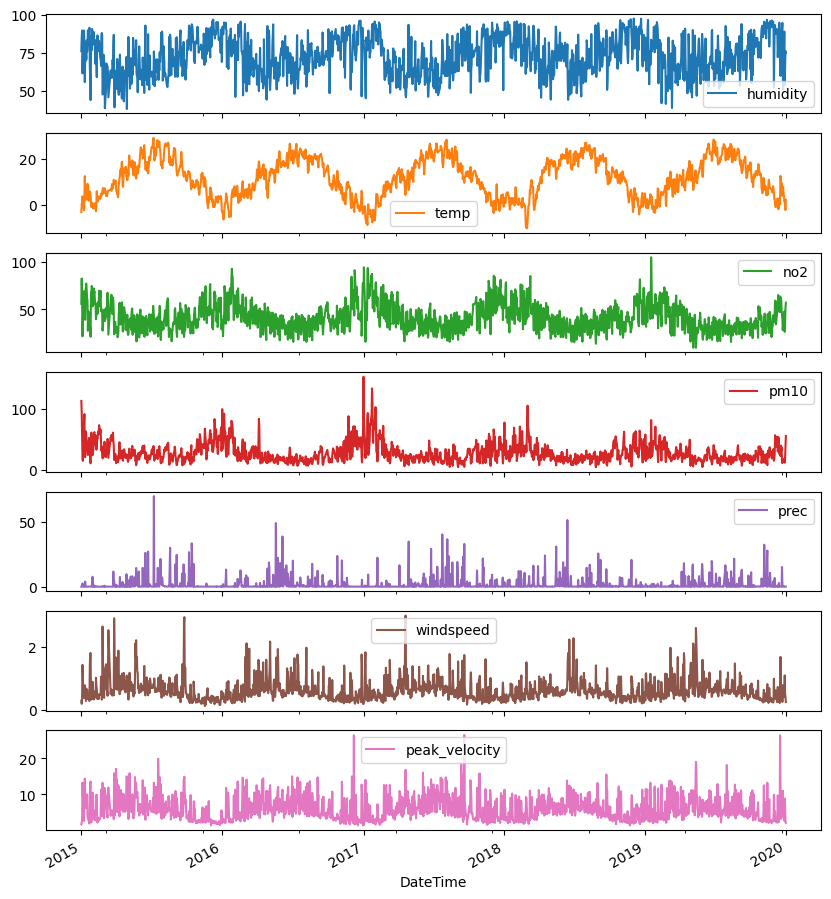

In [12]:
data1519.plot(subplots=True, figsize=(10, 12))
plt.show()

## In welchen Bereichen bewegen sich die Daten?

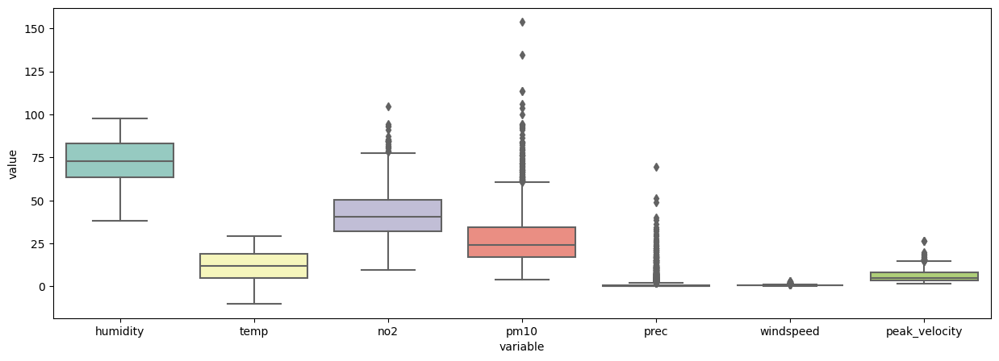

In [13]:
data1519melted = data1519.drop(columns=["day_type"]).melt()
fig, ax = plt.subplots(figsize=(15,5))

sns.boxplot(x='variable', y='value', data = data1519melted, palette="Set3")

plt.show()

## NO2 im Verhältnis zu anderen Daten

In [14]:
# FIXME data1519["temp2"] = data1519["temp"] * data1519["temp"]

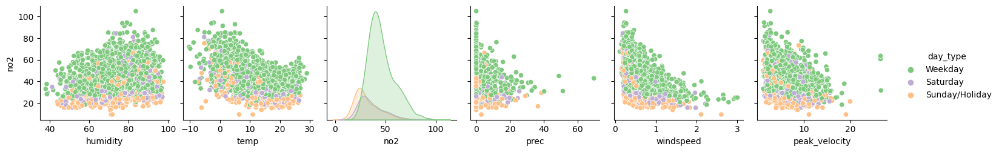

In [15]:
sns.pairplot(data1519.drop(columns=['pm10']), y_vars = 'no2', hue="day_type", palette="Accent")
plt.show()

### Beobachtungen

- bei hoher Luftfeutchtigkeit steigt NO2
- bei niedrigen Temperaturen steigt NO2
- hohe Niederschlag senkt NO2
- starke Windbewegungen erhöhen NO2

## Bestehen lineare Zusammenhänge auf Grundlage von PearsonR?

"Pearson's Korrelationskoeffizient (R) ist ein Maß für die lineare Korrelation zwischen zwei Variablen. Er variiert zwischen -1 und +1, wobei +1 eine perfekte positive Korrelation, -1 eine perfekte negative Korrelation und 0 keine Korrelation bedeutet. Hier ist eine allgemeine Richtlinie, um die Stärke der Korrelation basierend auf dem Wert von R zu interpretieren:

    Sehr schwach: ∣R∣<0.2∣R∣<0.2
    Schwach: 0.2≤∣R∣<0.40.2≤∣R∣<0.4
    Moderat: 0.4≤∣R∣<0.60.4≤∣R∣<0.6
    Stark: 0.6≤∣R∣<0.80.6≤∣R∣<0.8
    Sehr stark: ∣R∣≥0.8∣R∣≥0.8

Unter Verwendung dieser Richtlinien können wir die von Ihnen bereitgestellten Pearson-Korrelationswerte wie folgt interpretieren:

    no2_R_humidity: 0.219 - Eine schwache positive Korrelation zwischen Stickstoffdioxid (NO2) und Luftfeuchtigkeit.

    pm10_R_humidity: 0.289 - Ebenfalls eine schwache positive Korrelation zwischen Feinstaub (PM10) und Luftfeuchtigkeit.

    no2_R_temp: -0.513 - Eine moderate negative Korrelation zwischen NO2 und Temperatur.

    pm10_R_temp: -0.487 - Eine moderate negative Korrelation zwischen PM10 und Temperatur.

    no2_R_prec: -0.161 - Eine sehr schwache negative Korrelation zwischen NO2 und Niederschlag.

    pm10_R_prec: -0.224 - Eine schwache negative Korrelation zwischen PM10 und Niederschlag.

    no2_R_windspeed: -0.411 - Eine moderate negative Korrelation zwischen NO2 und Windgeschwindigkeit.

    pm10_R_windspeed: -0.378 - Eine schwache bis moderate negative Korrelation zwischen PM10 und Windgeschwindigkeit.

    no2_R_peak_velocity: -0.333 - Eine schwache bis moderate negative Korrelation zwischen NO2 und Spitzenwindgeschwindigkeit.

    pm10_R_peak_velocity: -0.384 - Eine schwache bis moderate negative Korrelation zwischen PM10 und Spitzenwindgeschwindigkeit.

Diese Werte deuten darauf hin, dass es einige lineare Abhängigkeiten zwischen den gemessenen Variablen gibt, aber keine davon ist besonders stark. Die stärksten linearen Zusammenhänge sind negativ und existieren zwischen der Temperatur und den Schadstoffkonzentrationen von NO2 und PM10. Es ist wichtig zu beachten, dass ein Pearson-Korrelationskoeffizient nur lineare Zusammenhänge misst und keine kausalen Beziehungen impliziert. Nichtlineare Zusammenhänge oder Beziehungen, die durch viele verschiedene Variablen beeinflusst werden, können mit diesem Koeffizienten nicht vollständig erfasst werden."

## PM10 im Verhältnis zu anderen Daten

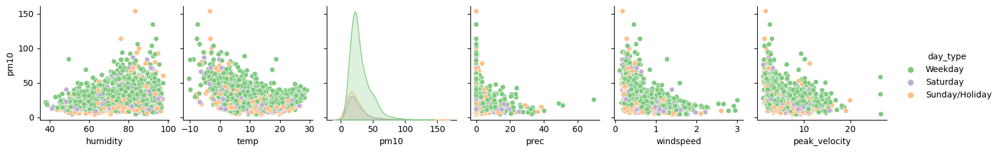

In [16]:
sns.pairplot(data1519.drop(columns=['no2']), y_vars = 'pm10', hue="day_type", palette="Accent")
plt.show()

### Beobachtungen

- die Beobachtungen für PM10 ähneln denen von NO2

## Beobachtungen überprüft mit einer Korrelationsmatrix

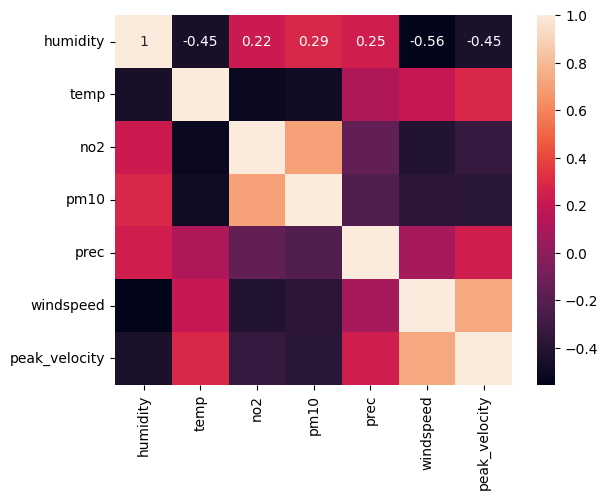

In [17]:
data1519nodaytype = data1519.drop(columns=['day_type'])
correlation_matrix = data1519nodaytype.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.show()

### Ergebnisse

- hohe Luftfeuchtigkeit zeigt einen positiven Zusammenhang mit NO2
- dasselbe gilt für PM10

### Alternative Plots

In [18]:
import seaborn.objects as so

In [19]:
potential_predictors = [e for e in data1519.columns.tolist() if e not in ["pm10", "no2"]]

In [20]:
from matplotlib import style

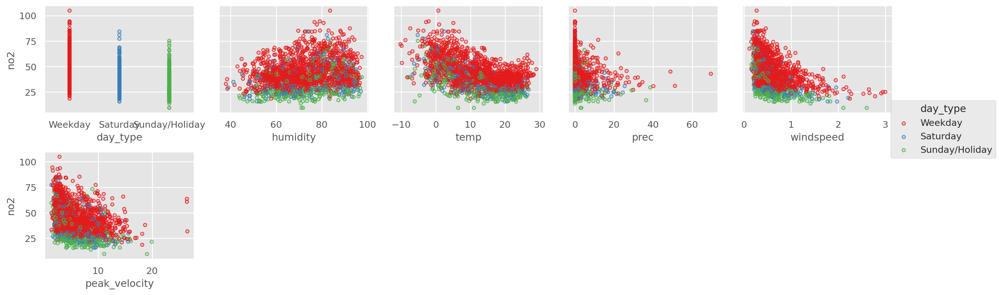

In [21]:
so.Plot(data1519, y="no2", color="day_type").pair(x = potential_predictors, wrap=5).add(so.Dots()).layout(size=(15,5)).scale(color="Set1").theme({**style.library["ggplot"]})

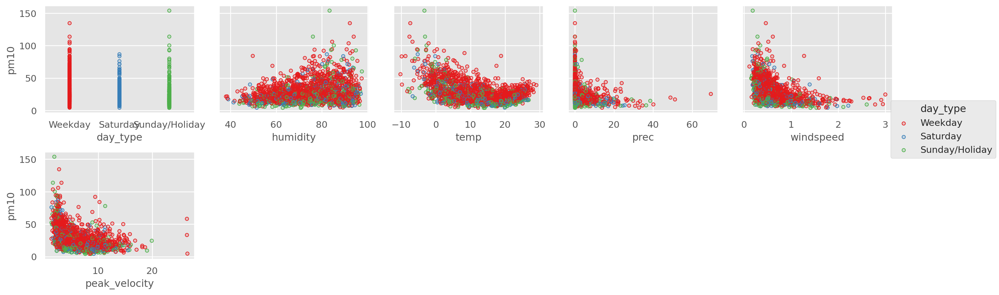

In [22]:
so.Plot(data1519, y="pm10", color="day_type").pair(x = potential_predictors, wrap=5).add(so.Dots()).layout(size=(15,5)).scale(color="Set1").theme({**style.library["ggplot"]})

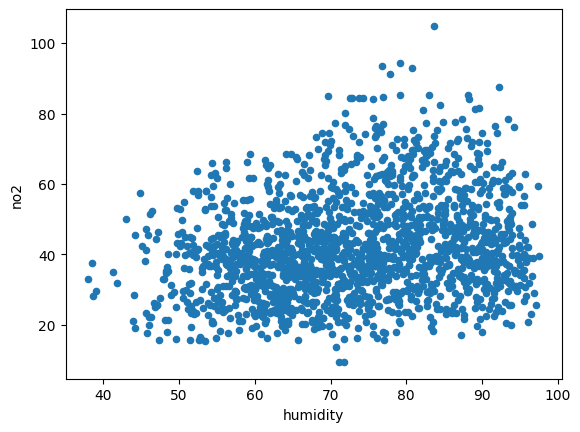

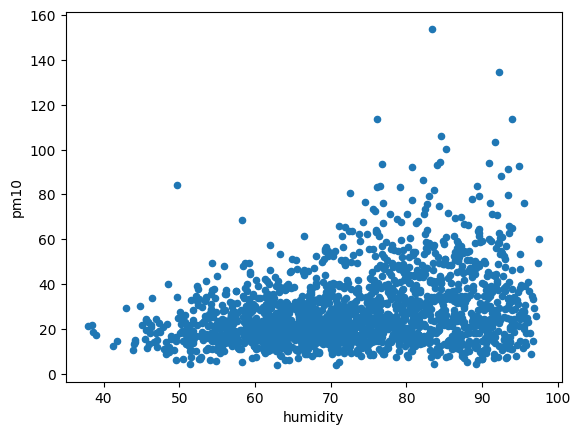

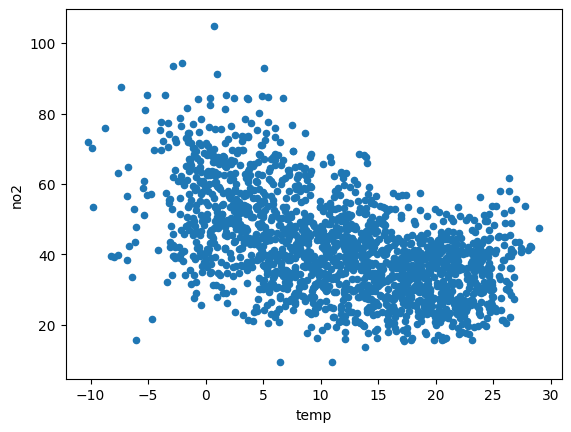

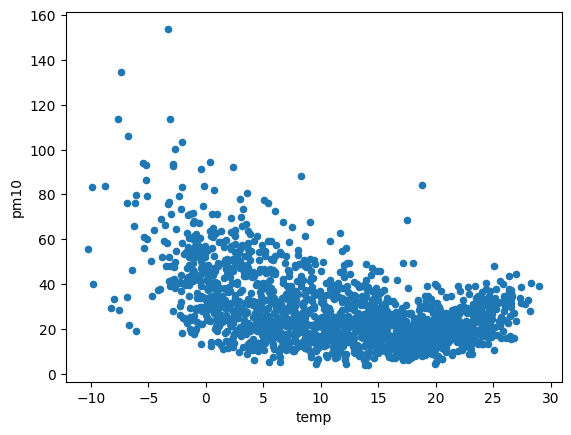

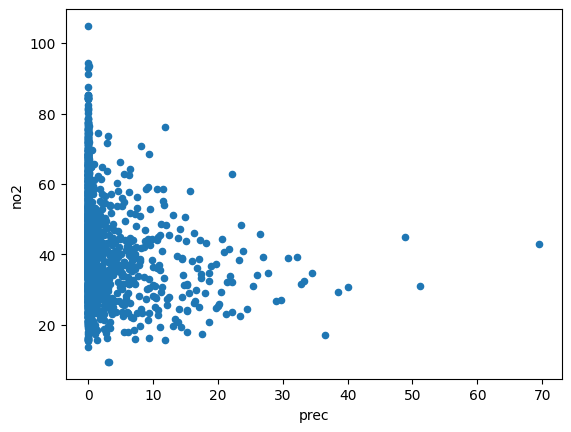

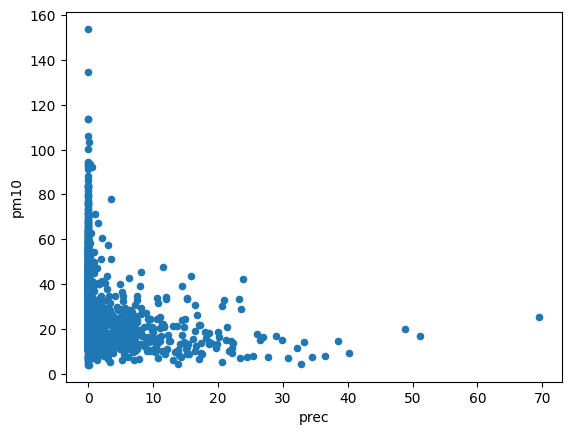

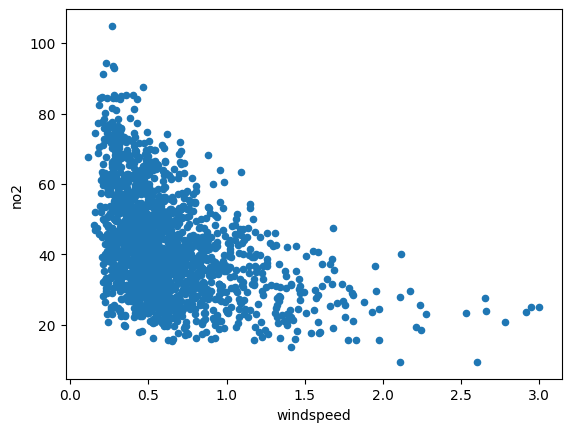

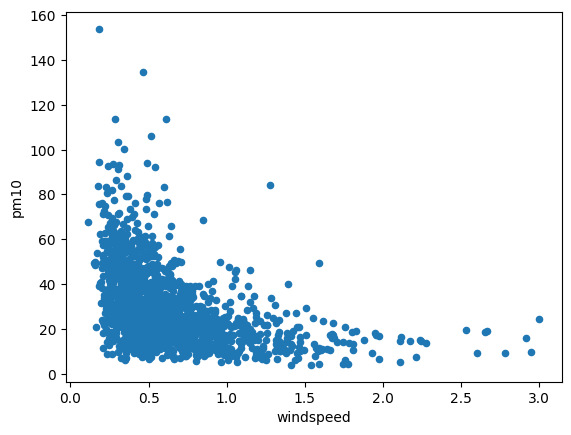

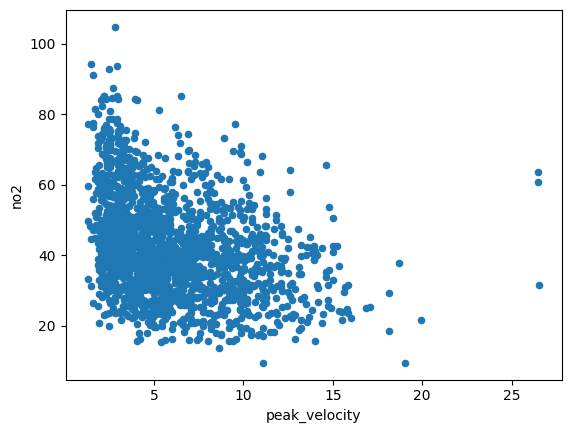

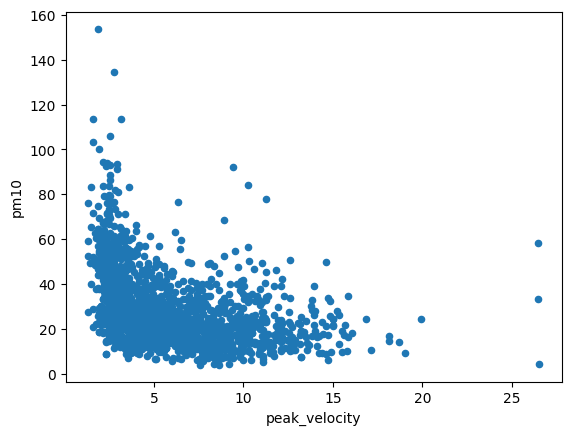

In [23]:
# Scatterplots für no2 und pm10 mit allen anderen Variablen
for column in data1519.columns.drop(['no2', 'pm10', 'day_type']):
    data1519.plot(kind='scatter', x=column, y='no2')
    data1519.plot(kind='scatter', x=column, y='pm10')

Die Niederschlagswerte (prec) sowie die Windwerte (windspeed und peak_velocity) sehen eher nicht nach einem linearen Zusammenhang mit NO2 und PM10 aus.

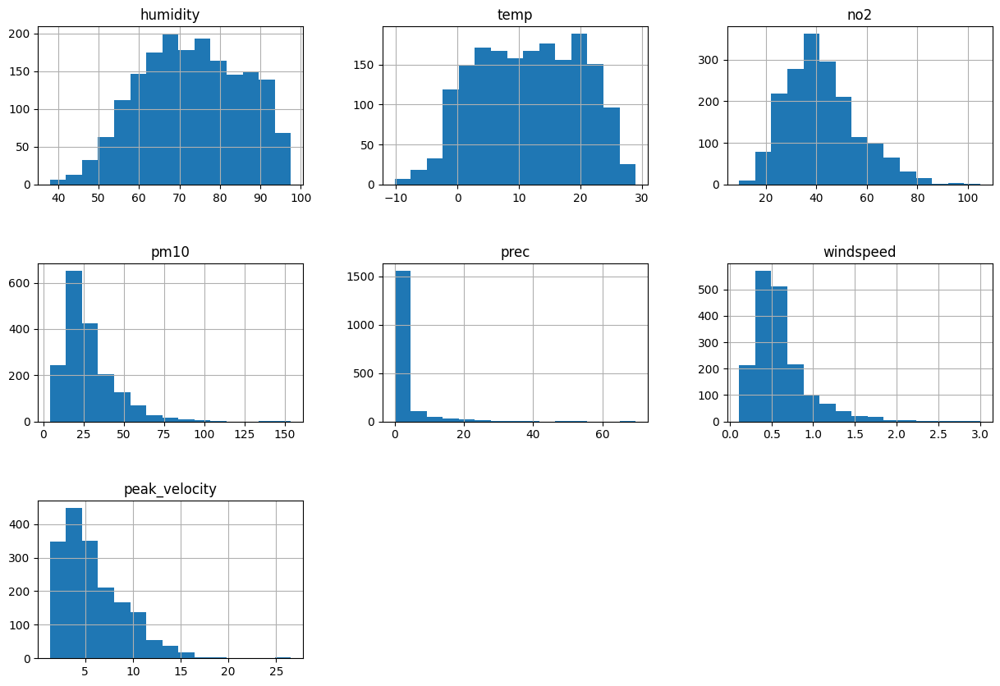

In [24]:
data1519.hist(bins=15, figsize=(15, 10))
plt.subplots_adjust(hspace=0.5)
plt.show()

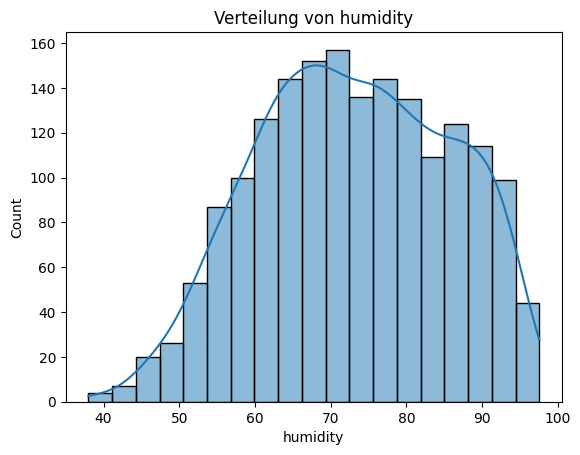

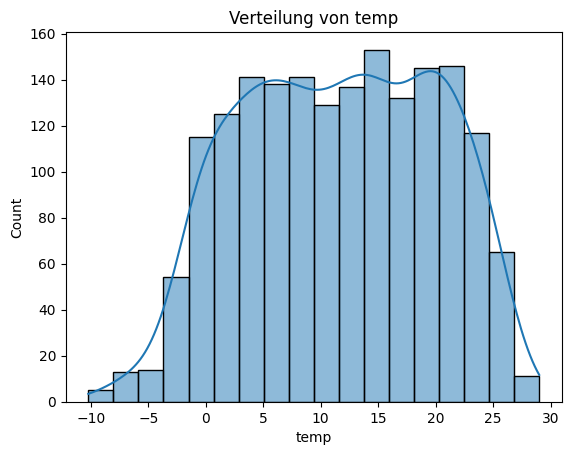

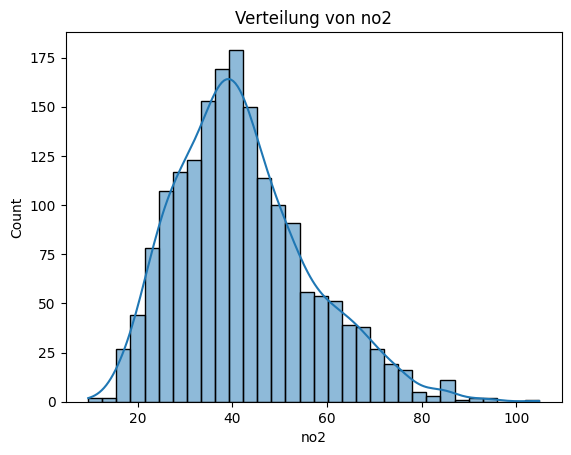

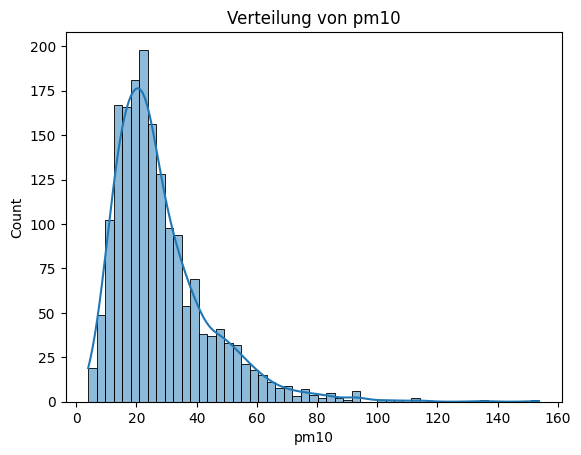

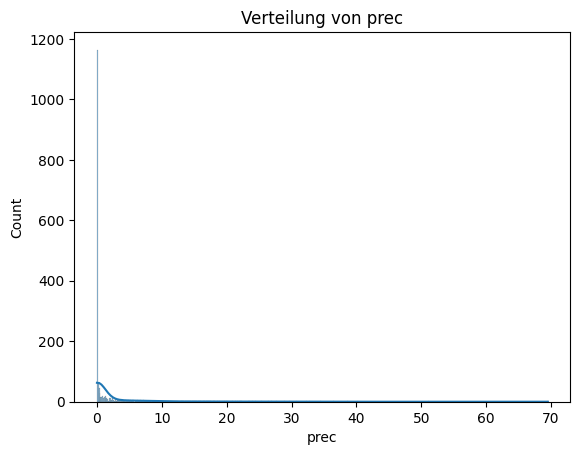

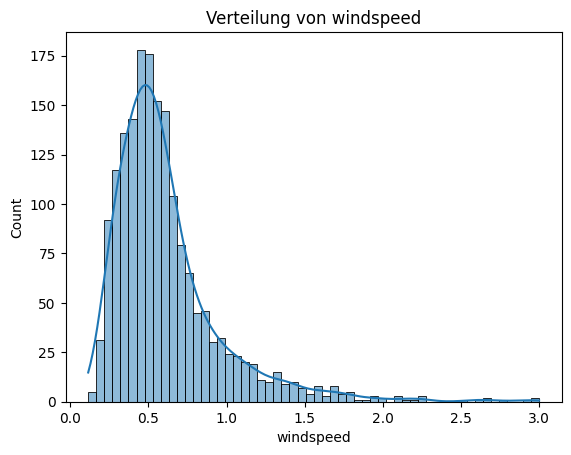

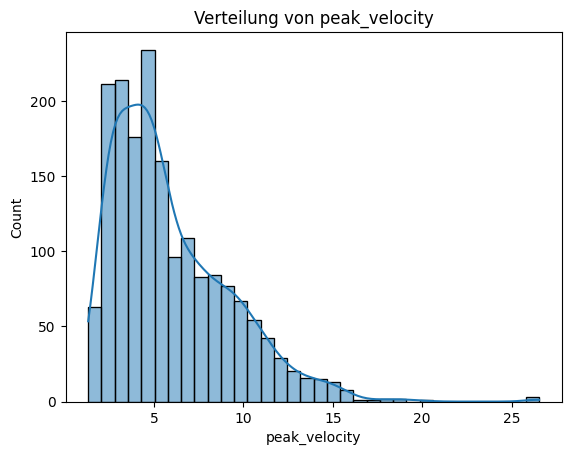

In [25]:
for column in data1519.select_dtypes(include=['float64']).columns:
    sns.histplot(data1519[column], kde=True)
    plt.title(f'Verteilung von {column}')
    plt.show()

## Mittelwertbetrachtungen über die Zeit

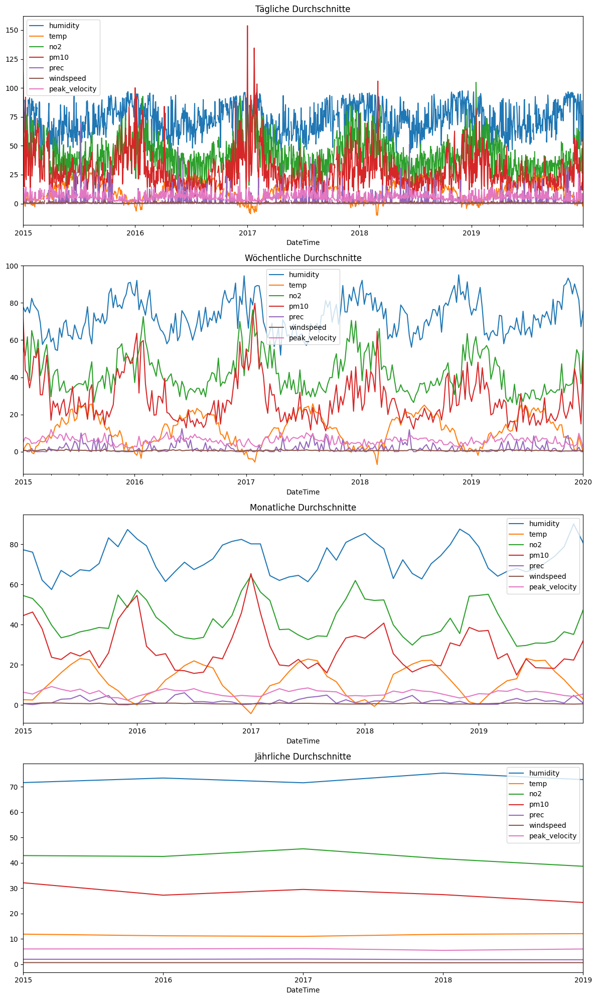

In [26]:
# Tagesmittelwerte (wenn Daten stündlich oder minutengenau sind)
daily_means = data1519nodaytype.resample('D').mean()

# Wöchentliche Mittelwerte
weekly_means = data1519nodaytype.resample('W').mean()

# Monatliche Mittelwerte
monthly_means = data1519nodaytype.resample('M').mean()

# Jährliche Mittelwerte
annual_means = data1519nodaytype.resample('A').mean()

# Erstellen Sie Zeitreihendiagramme für jede Zeitskala
fig, axes = plt.subplots(4, 1, figsize=(12, 20))
daily_means.plot(ax=axes[0], title='Tägliche Durchschnitte')
weekly_means.plot(ax=axes[1], title='Wöchentliche Durchschnitte')
monthly_means.plot(ax=axes[2], title='Monatliche Durchschnitte')
annual_means.plot(ax=axes[3], title='Jährliche Durchschnitte')
plt.tight_layout()
plt.show()


# 2. Erstellen Sie ein erstes Modell für pm10 und no2 mit Ihren Daten. Wir sieht das Modell aus? Evaluieren Sie und überlegen Sie, ob Verbesserungen gut wären! Wie sieht es diagnostisch aus? Welche Prädiktoren sind sinnvoll? (ANOVA! 𝑅2!)

## Erstellen der Modelle für pm10 und no2

Alle Daten außer no2 und pm10 sollen Prädiktoren sein.

"Wir wollen Schadstoffe unabhängig von einander betrachten, daher die Responses nicht als Prädiktoren im jeweils anderen Modell verwenden. Also no2 ist kein Prädiktor in dem Modell für pm10 und umgekehrt."

In [27]:
predictor = data1519.drop(columns=['no2', 'pm10'])

### NO2 Modell

In [28]:
data1519["locno2"] = np.log(data1519["no2"])

In [29]:
no2_model = smf.ols("locno2 ~ humidity + temp + windspeed + peak_velocity + C(day_type)", data=data1519).fit()

print(no2_model.summary())

                            OLS Regression Results                            
Dep. Variable:                 locno2   R-squared:                       0.652
Model:                            OLS   Adj. R-squared:                  0.651
Method:                 Least Squares   F-statistic:                     553.5
Date:                Tue, 27 Feb 2024   Prob (F-statistic):               0.00
Time:                        09:32:45   Log-Likelihood:                 322.55
No. Observations:                1781   AIC:                            -631.1
Df Residuals:                    1774   BIC:                            -592.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [30]:
sm.stats.anova_lm(no2_model, typ=2)

,sum_sq,df,F,PR(>F)
C(day_type),51.608359,2.0,630.608357,1.317008e-207
humidity,10.111459,1.0,247.106120,3.135644e-52
temp,45.177819,1.0,1104.065725,1.215045e-188
windspeed,27.160372,1.0,663.751293,1.322836e-124
peak_velocity,0.867747,1.0,21.206202,4.417634e-06
Residual,72.591195,1774.0,NaN,NaN


In [31]:
from plot_utility import Linear_Reg_Diagnostic

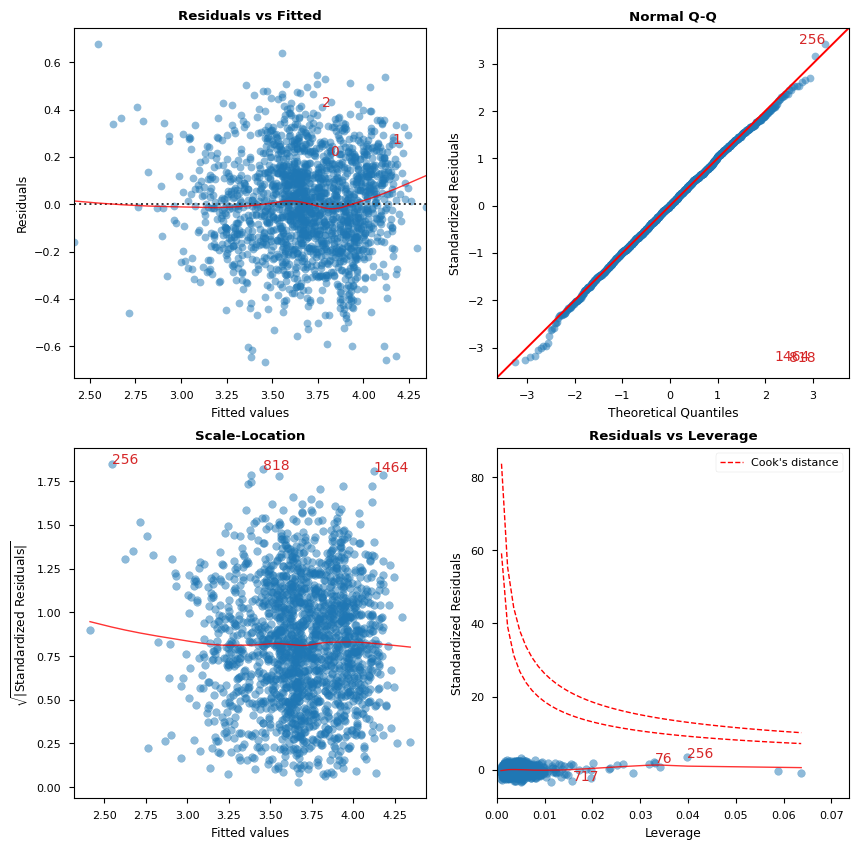

                        Features  VIF Factor
1        C(day_type)[T.Saturday]        1.04
2  C(day_type)[T.Sunday/Holiday]        1.04
4                           temp        1.32
3                       humidity        1.75
6                  peak_velocity        2.27
5                      windspeed        2.61
0                      Intercept       94.93


In [32]:
diagnostics = Linear_Reg_Diagnostic(no2_model)
diagnostics()
plt.show()

In [33]:
data1519["no2_fit"] = no2_model.fittedvalues

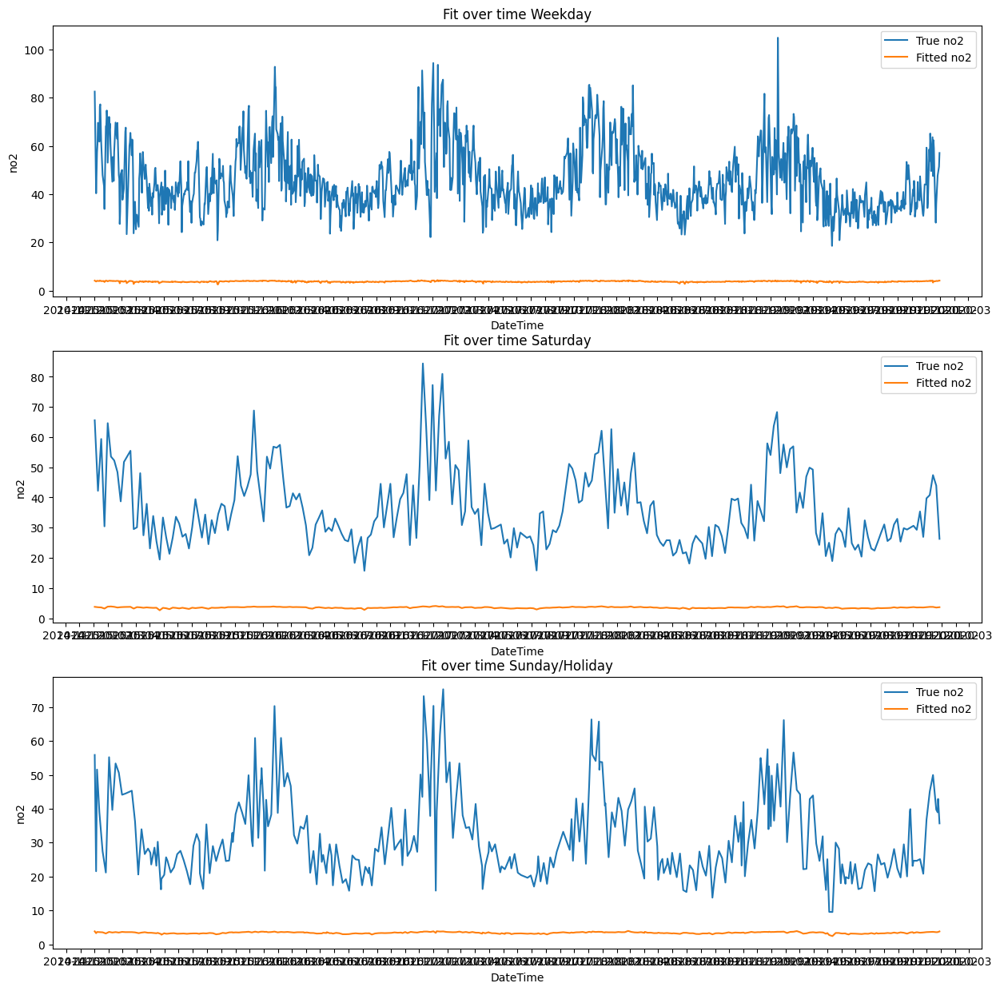

In [34]:
fig, ax = plt.subplots(3, 1, figsize=(15,15))

sns.lineplot(data=data1519[data1519["day_type"] == "Weekday"], x="DateTime", y="no2", ax=ax[0], label="True no2")
sns.lineplot(data=data1519[data1519["day_type"] == "Weekday"], x="DateTime", y="no2_fit", ax=ax[0], label="Fitted no2")
sns.scatterplot(data=data1519[(data1519["day_type"] == "Weekday") & (data1519["temp"] == 0)], x="DateTime", y="no2", ax=ax[0], color="red")
ax[0].set_title("Fit over time Weekday")
ax[0].xaxis.set_major_locator(mdates.MonthLocator(interval=1))

sns.lineplot(data=data1519[data1519["day_type"] == "Saturday"], x="DateTime", y="no2", ax=ax[1], label="True no2")
sns.lineplot(data=data1519[data1519["day_type"] == "Saturday"], x="DateTime", y="no2_fit", ax=ax[1], label="Fitted no2")
sns.scatterplot(data=data1519[(data1519["day_type"] == "Saturday") & (data1519["temp"] == 0)], x="DateTime", y="no2", ax=ax[1], color="red")
ax[1].set_title("Fit over time Saturday")
ax[1].xaxis.set_major_locator(mdates.MonthLocator(interval=1))

sns.lineplot(data=data1519[data1519["day_type"] == "Sunday/Holiday"], x="DateTime", y="no2", ax=ax[2], label="True no2")
sns.lineplot(data=data1519[data1519["day_type"] == "Sunday/Holiday"], x="DateTime", y="no2_fit", ax=ax[2], label="Fitted no2")
sns.scatterplot(data=data1519[(data1519["day_type"] == "Sunday/Holiday") & (data1519["temp"] == 0)], x="DateTime", y="no2", ax=ax[2], color="red")
ax[2].set_title("Fit over time Sunday/Holiday")
ax[2].xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax[2].legend()

plt.show()

### PM10 Modell

In [35]:
pm10_model = smf.ols("pm10 ~ humidity + temp + prec + windspeed + peak_velocity + C(day_type)", data=data1519).fit()

print(pm10_model.summary())

                            OLS Regression Results                            
Dep. Variable:                   pm10   R-squared:                       0.378
Model:                            OLS   Adj. R-squared:                  0.375
Method:                 Least Squares   F-statistic:                     153.9
Date:                Tue, 27 Feb 2024   Prob (F-statistic):          1.12e-177
Time:                        09:32:47   Log-Likelihood:                -7063.4
No. Observations:                1781   AIC:                         1.414e+04
Df Residuals:                    1773   BIC:                         1.419e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [36]:
sm.stats.anova_lm(pm10_model, typ=2)

,sum_sq,df,F,PR(>F)
C(day_type),15944.034062,2.0,48.673327,2.638434e-21
humidity,387.824390,1.0,2.367870,1.240343e-01
temp,59837.530639,1.0,365.339372,3.368174e-74
prec,5930.034282,1.0,36.205956,2.151801e-09
windspeed,13297.885686,1.0,81.190536,5.165528e-19
peak_velocity,553.699501,1.0,3.380625,6.613422e-02
Residual,290392.850816,1773.0,NaN,NaN


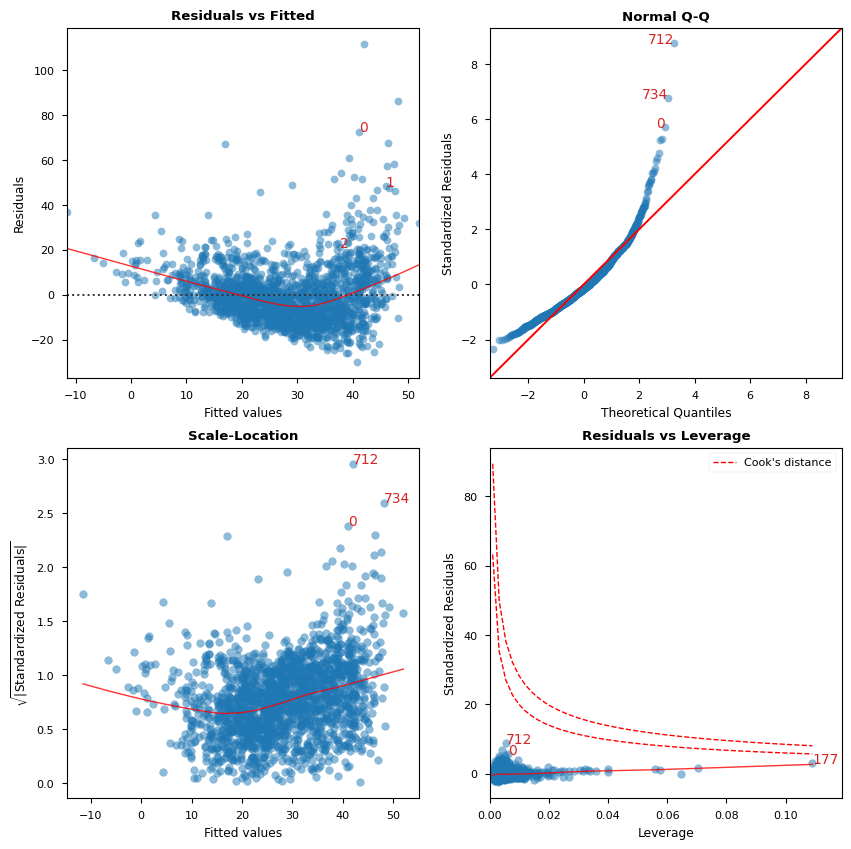

                        Features  VIF Factor
1        C(day_type)[T.Saturday]        1.04
2  C(day_type)[T.Sunday/Holiday]        1.04
5                           prec        1.35
4                           temp        1.40
3                       humidity        2.19
7                  peak_velocity        2.44
6                      windspeed        2.62
0                      Intercept      117.10


In [37]:
diagnostics = Linear_Reg_Diagnostic(pm10_model)
diagnostics()
plt.show()

Für PM10 Werte ist Q-Q Analyse relativ schlecht, für NO2 ziemlich gut.

In [38]:
data1519["pm10_fit"] = pm10_model.fittedvalues

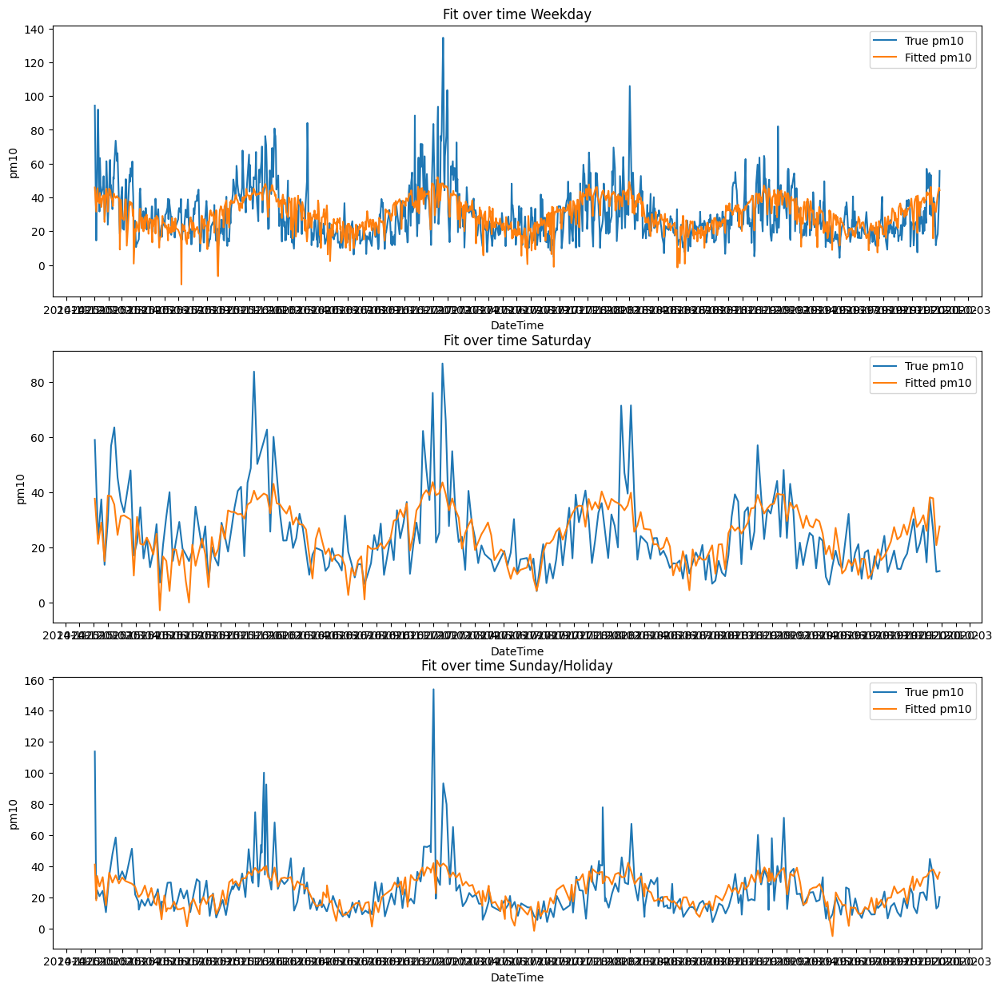

In [39]:
fig, ax = plt.subplots(3, 1, figsize=(15,15))

sns.lineplot(data=data1519[data1519["day_type"] == "Weekday"], x="DateTime", y="pm10", ax=ax[0], label="True pm10")
sns.lineplot(data=data1519[data1519["day_type"] == "Weekday"], x="DateTime", y="pm10_fit", ax=ax[0], label="Fitted pm10")
sns.scatterplot(data=data1519[(data1519["day_type"] == "Weekday") & (data1519["temp"] == 0)], x="DateTime", y="pm10", ax=ax[0], color="red")
ax[0].set_title("Fit over time Weekday")
ax[0].xaxis.set_major_locator(mdates.MonthLocator(interval=1))

sns.lineplot(data=data1519[data1519["day_type"] == "Saturday"], x="DateTime", y="pm10", ax=ax[1], label="True pm10")
sns.lineplot(data=data1519[data1519["day_type"] == "Saturday"], x="DateTime", y="pm10_fit", ax=ax[1], label="Fitted pm10")
sns.scatterplot(data=data1519[(data1519["day_type"] == "Saturday") & (data1519["temp"] == 0)], x="DateTime", y="pm10", ax=ax[1], color="red")
ax[1].set_title("Fit over time Saturday")
ax[1].xaxis.set_major_locator(mdates.MonthLocator(interval=1))

sns.lineplot(data=data1519[data1519["day_type"] == "Sunday/Holiday"], x="DateTime", y="pm10", ax=ax[2], label="True pm10")
sns.lineplot(data=data1519[data1519["day_type"] == "Sunday/Holiday"], x="DateTime", y="pm10_fit", ax=ax[2], label="Fitted pm10")
sns.scatterplot(data=data1519[(data1519["day_type"] == "Sunday/Holiday") & (data1519["temp"] == 0)], x="DateTime", y="pm10", ax=ax[2], color="red")
ax[2].set_title("Fit over time Sunday/Holiday")
ax[2].xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax[2].legend()

plt.show()

# 3. Finden Sie heraus, was Inversion in einem meteorologischen Zusammenhang bedeutet und wie es sich auf Luftverschmutzung auswirken kann. Sie haben Daten aus einer Wetterstation in Kalkleiten bekommen. Ermitteln Sie die Differenz der Temperaturen zwischen der Station in Graz - der Station in Kalkleiten und fügen Sie diese Variable zu Ihrem Modell hinzu. Hilft das?

## Inversion in einem meterologischen Zusammenhang

"Unter Inversion versteht man in der Meteorologie die Umkehr des normalerweise mit der Höhe abnehmenden Temperaturverlaufs in einer mehr oder weniger dicken Schicht.

Inversionen können durch großräumige Advektion von Warmluft oder durch Absinkvorgänge in der entsprechenden Höhe sowie durch Abkühlung der unteren Luftschichten entstehen.

Vom Erdboden aufsteigende Warmluftblasen können eine solche Inversionsschicht nicht durchdringen. Somit stellt eine Inversion eine Sperrschicht dar, die einen Austausch zwischen tief liegenden und höher liegenden Luftschichten verhindert. Eine Inversion wirkt in der Atmosphäre stabilisierend.

Inversionen begünstigen die Bildung von Smog. Inversionswetterlagen sind insbesondere in industriell ausgerichteten Ballungsräumen gefürchtet, da sich die Luftschichten nicht durchmischen und sich somit innerhalb der Inversionsschicht die Luft mit Schadstoffen anreichern kann." [1]

"Eine Inversionswetterlage, auch Umkehrwetterlage, ist eine Wetterlage, die durch eine Umkehr (lateinisch: inversio) des üblichen vertikalen Temperaturgradienten in der Atmosphäre geprägt ist: Die oberen Luftschichten sind hierbei wärmer als die unteren. Der Bereich, in dem diese Inversion auftritt, wird als Inversionsschicht bezeichnet. 

Normalerweise nimmt die Lufttemperatur mit steigender Höhe ab, da sich die bodennahe Luft durch den Kontakt mit dem Erdboden erwärmt, während höherliegende Luftschichten Strahlungswärme an den Weltraum verlieren.

Wenn jedoch Rauchgase aus Heizungsanlagen oder Autoabgase bei Windstille zu erhöhten Staub­konzentrationen in den über Siedlungsgebieten liegenden Luftschichten führen, so filtert der Staub das Sonnenlicht und erwärmt die umgebende Luft. Vor allem im Winter kann die Staubkonzentration derart ansteigen, dass sich die betroffene Luftschicht über das Niveau der bodennahen Luft hinaus erwärmt und eine Inversionswetterlage entsteht.

Solange sich die Staubschicht durch die Sonneneinstrahlung ausreichend erwärmt und zugleich die übliche Erwärmung des Erdbodens reduziert, verbleibt die Inversionswetterlage. Die Situation kann sich dann oft erst durch aufkommenden Wind ändern." [2]

- Quellen: [1 Deutscher Wetterdienst](https://www.dwd.de/DE/service/lexikon/begriffe/I/Inversion.html) / [2 Wikipedia](https://de.wikipedia.org/wiki/Inversionswetterlage)

## Kalkleiten Wetterdaten in das vorhandene Datenset aufnehmen

In [40]:
datakalk = dailymeansdata["Kalkleiten"]
datakalk.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2192 entries, 2015-01-01 00:00:00+00:00 to 2020-12-31 00:00:00+00:00
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   day_type  2192 non-null   category
 1   temp      2171 non-null   float64 
dtypes: category(1), float64(1)
memory usage: 36.5 KB


In [41]:
datakalk.index

DatetimeIndex(['2015-01-01 00:00:00+00:00', '2015-01-02 00:00:00+00:00',
               '2015-01-03 00:00:00+00:00', '2015-01-04 00:00:00+00:00',
               '2015-01-05 00:00:00+00:00', '2015-01-06 00:00:00+00:00',
               '2015-01-07 00:00:00+00:00', '2015-01-08 00:00:00+00:00',
               '2015-01-09 00:00:00+00:00', '2015-01-10 00:00:00+00:00',
               ...
               '2020-12-22 00:00:00+00:00', '2020-12-23 00:00:00+00:00',
               '2020-12-24 00:00:00+00:00', '2020-12-25 00:00:00+00:00',
               '2020-12-26 00:00:00+00:00', '2020-12-27 00:00:00+00:00',
               '2020-12-28 00:00:00+00:00', '2020-12-29 00:00:00+00:00',
               '2020-12-30 00:00:00+00:00', '2020-12-31 00:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='DateTime', length=2192, freq=None)

In [42]:
datakalk1519 = datakalk[datakalk.index.year != 2020]

In [43]:
datakalk1519.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1826 entries, 2015-01-01 00:00:00+00:00 to 2019-12-31 00:00:00+00:00
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   day_type  1826 non-null   category
 1   temp      1807 non-null   float64 
dtypes: category(1), float64(1)
memory usage: 30.4 KB


In [44]:
merged_data = pd.merge(data1519, datakalk1519[['temp']], left_index=True, right_index=True, suffixes=('_data1519', '_datakalk1519'))

In [45]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1781 entries, 2015-01-01 00:00:00+00:00 to 2019-12-31 00:00:00+00:00
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   day_type           1781 non-null   category
 1   humidity           1781 non-null   float64 
 2   temp_data1519      1781 non-null   float64 
 3   no2                1781 non-null   float64 
 4   pm10               1781 non-null   float64 
 5   prec               1781 non-null   float64 
 6   windspeed          1781 non-null   float64 
 7   peak_velocity      1781 non-null   float64 
 8   locno2             1781 non-null   float64 
 9   no2_fit            1781 non-null   float64 
 10  pm10_fit           1781 non-null   float64 
 11  temp_datakalk1519  1762 non-null   float64 
dtypes: category(1), float64(11)
memory usage: 168.8 KB


In [46]:
merged_data['temp_diff'] = merged_data['temp_data1519'] - merged_data['temp_datakalk1519']
data1519['temp_diff'] = merged_data['temp_diff']
data1519.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1781 entries, 2015-01-01 00:00:00+00:00 to 2019-12-31 00:00:00+00:00
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   day_type       1781 non-null   category
 1   humidity       1781 non-null   float64 
 2   temp           1781 non-null   float64 
 3   no2            1781 non-null   float64 
 4   pm10           1781 non-null   float64 
 5   prec           1781 non-null   float64 
 6   windspeed      1781 non-null   float64 
 7   peak_velocity  1781 non-null   float64 
 8   locno2         1781 non-null   float64 
 9   no2_fit        1781 non-null   float64 
 10  pm10_fit       1781 non-null   float64 
 11  temp_diff      1762 non-null   float64 
dtypes: category(1), float64(11)
memory usage: 168.8 KB


### NO2 Modell updaten mit neuen Daten

In [47]:
no2_model_diff = smf.ols("no2 ~ humidity + temp_diff + prec + windspeed + peak_velocity + C(day_type)", data=data1519).fit()

print(no2_model_diff.summary())

                            OLS Regression Results                            
Dep. Variable:                    no2   R-squared:                       0.591
Model:                            OLS   Adj. R-squared:                  0.589
Method:                 Least Squares   F-statistic:                     362.2
Date:                Tue, 27 Feb 2024   Prob (F-statistic):               0.00
Time:                        09:32:50   Log-Likelihood:                -6390.8
No. Observations:                1762   AIC:                         1.280e+04
Df Residuals:                    1754   BIC:                         1.284e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [48]:
sm.stats.anova_lm(no2_model_diff, typ=2)

,sum_sq,df,F,PR(>F)
C(day_type),75283.511632,2.0,452.664613,3.081855e-159
humidity,309.342050,1.0,3.720023,5.392482e-02
temp_diff,77578.443296,1.0,932.927151,1.163151e-164
prec,830.288158,1.0,9.984711,1.605384e-03
windspeed,3560.164775,1.0,42.813109,7.881801e-11
peak_velocity,276.511892,1.0,3.325221,6.839497e-02
Residual,145855.535825,1754.0,NaN,NaN


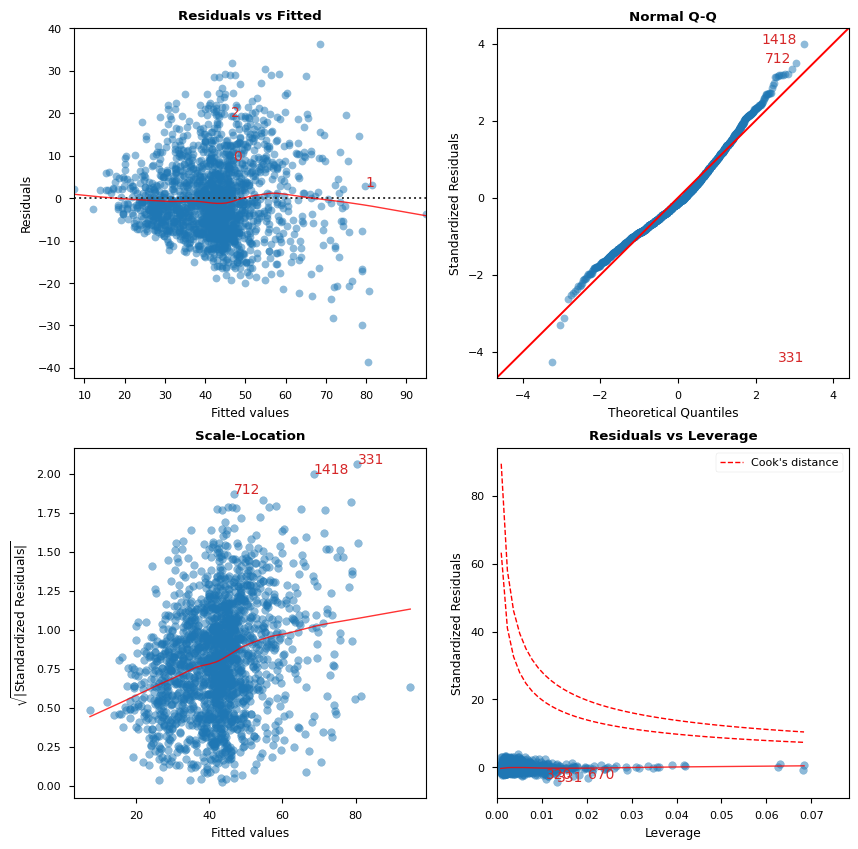

                        Features  VIF Factor
1        C(day_type)[T.Saturday]        1.04
2  C(day_type)[T.Sunday/Holiday]        1.04
5                           prec        1.33
4                      temp_diff        1.33
3                       humidity        1.77
7                  peak_velocity        2.41
6                      windspeed        2.75
0                      Intercept       86.38


In [49]:
diagnostics = Linear_Reg_Diagnostic(no2_model_diff)
diagnostics()
plt.show()

### Testweise die Prädiktoren mit einem relativen hohen P-Value entfernen und die Modelle vergleichen.

- humidity 	5.392482e-02
- prec 	    1.605384e-03
- peak_velocity 	6.839497e-02

In [50]:
no2_model_diff_smaller = smf.ols("no2 ~ temp_diff + windspeed + C(day_type)", data=data1519).fit()

print(no2_model_diff_smaller.summary())

                            OLS Regression Results                            
Dep. Variable:                    no2   R-squared:                       0.584
Model:                            OLS   Adj. R-squared:                  0.583
Method:                 Least Squares   F-statistic:                     617.0
Date:                Tue, 27 Feb 2024   Prob (F-statistic):               0.00
Time:                        09:32:51   Log-Likelihood:                -6405.7
No. Observations:                1762   AIC:                         1.282e+04
Df Residuals:                    1757   BIC:                         1.285e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [51]:
sm.stats.anova_lm(no2_model_diff_smaller, typ=2)

,sum_sq,df,F,PR(>F)
C(day_type),75387.071855,2.0,446.452912,1.675140e-157
temp_diff,82482.747779,1.0,976.949019,6.518150e-171
windspeed,8851.877857,1.0,104.844148,6.122528e-24
Residual,148341.607382,1757.0,NaN,NaN


In [52]:
print("R2")
print(no2_model_diff.rsquared)
print(no2_model_diff_smaller.rsquared)
print("R2 adjusted")
print(no2_model_diff.rsquared_adj)
print(no2_model_diff_smaller.rsquared_adj)
print("AIC und BIC")
print(f"AIC: {no2_model_diff.aic} | BIC: {no2_model_diff.bic}")
print(f"AIC: {no2_model_diff_smaller.aic} | BIC: {no2_model_diff_smaller.bic}")

R2
0.5911080852785707
0.5841386236579355
R2 adjusted
0.5894762475345285
0.5831918703822563
AIC und BIC
AIC: 12797.625862941553 | BIC: 12841.419501393522
AIC: 12821.405637874952 | BIC: 12848.776661907432


Das Entfernen hat zu Verschlechterung der R2 Werte geführt, daher nicht sinnvoll.

### PM10 Modell updaten mit neuen Daten

In [53]:
pm10_model_diff = smf.ols("pm10 ~ humidity + temp_diff + prec + windspeed + peak_velocity + C(day_type)", data=data1519).fit()

print(pm10_model_diff.summary())

                            OLS Regression Results                            
Dep. Variable:                   pm10   R-squared:                       0.435
Model:                            OLS   Adj. R-squared:                  0.432
Method:                 Least Squares   F-statistic:                     192.7
Date:                Tue, 27 Feb 2024   Prob (F-statistic):          4.64e-212
Time:                        09:32:51   Log-Likelihood:                -6909.2
No. Observations:                1762   AIC:                         1.383e+04
Df Residuals:                    1754   BIC:                         1.388e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [54]:
sm.stats.anova_lm(pm10_model_diff, typ=2)

,sum_sq,df,F,PR(>F)
C(day_type),20022.552728,2.0,66.840401,1.058287e-28
humidity,4452.594993,1.0,29.727801,5.678019e-08
temp_diff,83429.357799,1.0,557.017059,3.520800e-107
prec,8954.479898,1.0,59.784687,1.770716e-14
windspeed,278.758960,1.0,1.861137,1.726686e-01
peak_velocity,4708.345152,1.0,31.435320,2.390756e-08
Residual,262712.050457,1754.0,NaN,NaN


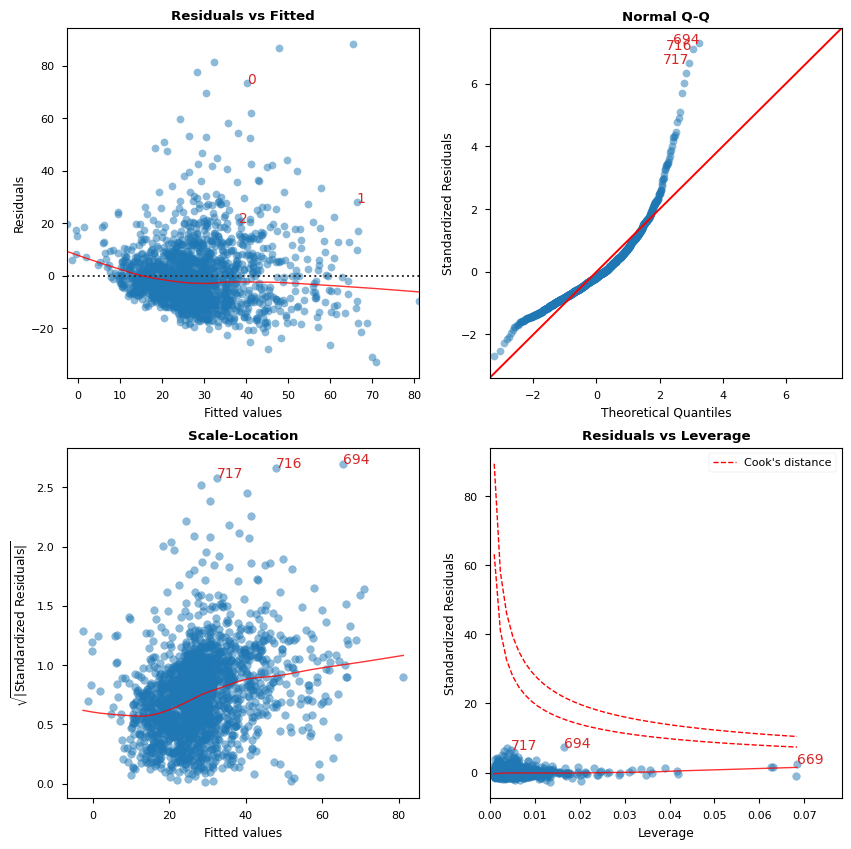

                        Features  VIF Factor
1        C(day_type)[T.Saturday]        1.04
2  C(day_type)[T.Sunday/Holiday]        1.04
5                           prec        1.33
4                      temp_diff        1.33
3                       humidity        1.77
7                  peak_velocity        2.41
6                      windspeed        2.75
0                      Intercept       86.38


In [55]:
diagnostics = Linear_Reg_Diagnostic(pm10_model_diff)
diagnostics()
plt.show()

Die R2 und R2_adj haben sich für beide Betrachtungen verbessert. Windspeed hat einen relativ hohen P-Wert in der PM10 Betrachtung. 

In [56]:
# data1519_day_type_converted = pd.get_dummies(data1519, columns=['day_type'])

# data1519_day_type_converted['day_type_Weekday'] = data1519_day_type_converted['day_type_Weekday'].astype(int)
# data1519_day_type_converted['day_type_Saturday'] = data1519_day_type_converted['day_type_Saturday'].astype(int)
# data1519_day_type_converted['day_type_Sunday/Holiday'] = data1519_day_type_converted['day_type_Sunday/Holiday'].astype(int)

# new_column_names = {
#     'day_type_Sunday/Holiday': 'Typ_Sonntag_Feiertag'
# }
# data1519_day_type_converted.rename(columns=new_column_names, inplace=True)

# data1519_day_type_converted.head()

In [57]:
# no2_model_conv = smf.ols("no2 ~ humidity + temp + prec + windspeed + peak_velocity + day_type_Weekday + day_type_Saturday + Typ_Sonntag_Feiertag", data=data1519_day_type_converted).fit()

# print(no2_model_conv.summary())

# Dies führt zu einer multicollinearity warning, also nicht sinnvoll

# 4. Erstellen Sie Variablen, die vielleicht hilfreich sein können. Helfen diese Variablen? Adaptieren Sie Ihr Modell passend!

z.B. eine Variable die frost (temperatur < 0) anzeigt, eine Variable die inversion anzeigt (temperatur_differenz < 0), eine Variable die starken Wind anzeigt (z.B. wind_speed > 0.6), eine Variable für das Jahr, etc. Versuchen Sie, lagged values für meteorologische Einflüsse einzufügen, z.B. die Temperatur des Vortages etc.

## Neue Variablen anlegen

In [58]:
data1519['frost'] = data1519['temp'] < 0
data1519['inversion'] = data1519['temp_diff'] < 0
data1519['strong_wind'] = data1519['windspeed'] > 0.6
data1519['year'] = data1519.index.year
data1519['month'] = data1519.index.month

## Lagged values anlegen

In [59]:
data1519['temp_lag1'] = data1519['temp'].shift(1)
data1519['humidity_lag1'] = data1519['humidity'].shift(1)
data1519['prec_lag1'] = data1519['prec'].shift(1)
data1519['windspeed_lag1'] = data1519['windspeed'].shift(1)
data1519['peak_velocity_lag1'] = data1519['peak_velocity'].shift(1)

## NO2 im Verhältnis zu allen

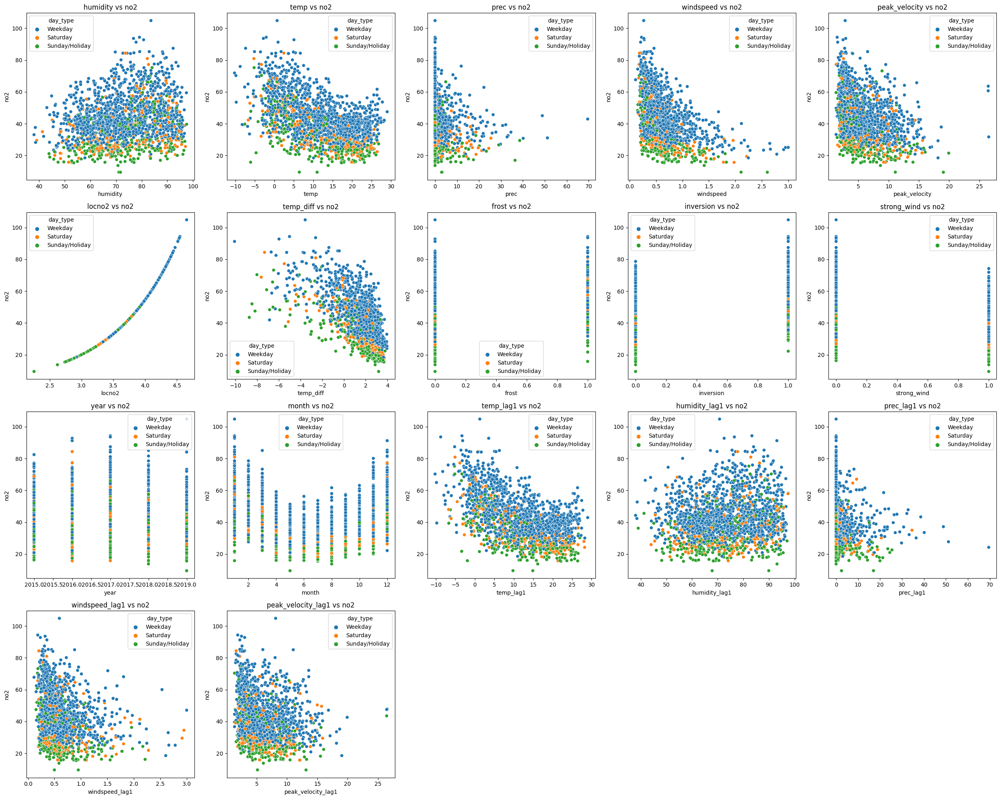

In [60]:
columns_to_plot = data1519.columns.drop(['no2', 'pm10', 'day_type', 'no2_fit', 'pm10_fit'])

# Calculate the number of rows needed for the subplots
num_plots = len(columns_to_plot)
num_rows = (num_plots + 4) // 5  # to have up to 5 plots per row

# Create a figure and a grid of subplots
fig, axs = plt.subplots(num_rows, 5, figsize=(25, 5 * num_rows))  # Adjust the figure size as needed

# Flatten the array of axes, for easy iteration
axs = axs.flatten()

# Counter for the current subplot
plot_number = 0

for column in columns_to_plot:
    # Scatter plot for 'no2'
    sns.scatterplot(x=data1519[column], y=data1519['no2'], hue=data1519['day_type'], ax=axs[plot_number])
    axs[plot_number].set_title(f'{column} vs no2')
    plot_number += 1  # Move to the next subplot

    # # Scatter plot for 'pm10'
    # sns.scatterplot(x=data1519[column], y=data1519['pm10'], hue=data1519['day_type'], ax=axs[plot_number])
    # axs[plot_number].set_title(f'{column} vs pm10')
    # plot_number += 1  # Move to the next subplot

# If the last row is not completely filled, turn off the remaining axes
for i in range(plot_number, num_rows * 5):
    axs[i].axis('off')

plt.tight_layout()
plt.show()


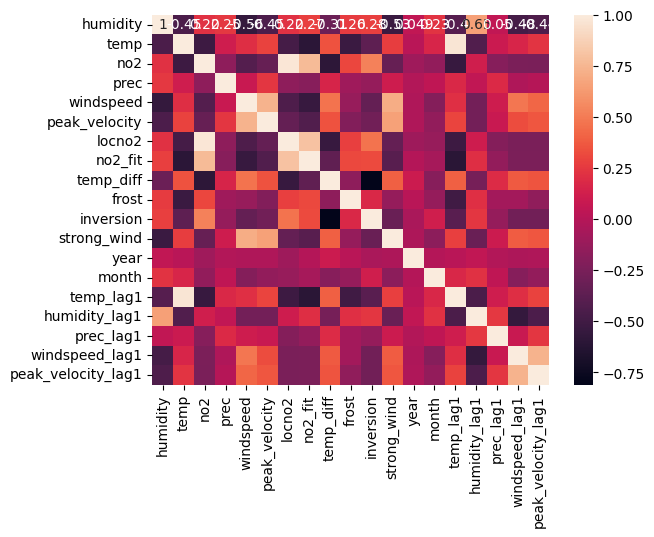

In [61]:
data1519nodaytype = data1519.drop(columns=['day_type', "pm10", "pm10_fit"])
correlation_matrix = data1519nodaytype.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.show()

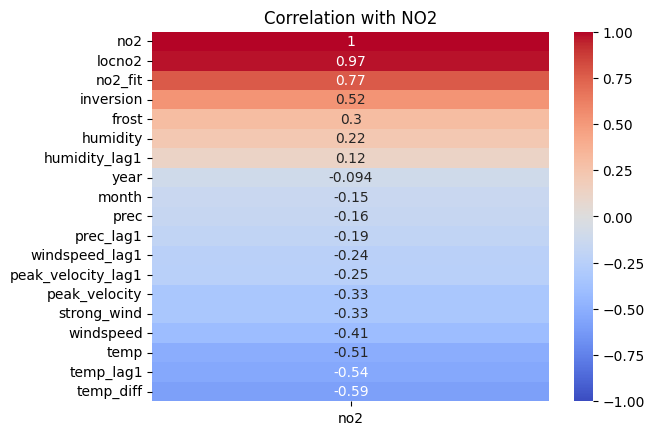

In [62]:
no2_correlation = correlation_matrix[['no2']].sort_values(by='no2', ascending=False)

sns.heatmap(no2_correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation with NO2")
plt.show()

In [63]:
no2_model_diff = smf.ols("no2 ~  humidity_lag1 + temp_diff + windspeed_lag1 + np.log(peak_velocity_lag1) + temp_lag1 + C(frost) + month + C(day_type)", data=data1519).fit()

print(no2_model_diff.summary())

                            OLS Regression Results                            
Dep. Variable:                    no2   R-squared:                       0.734
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     535.7
Date:                Tue, 27 Feb 2024   Prob (F-statistic):               0.00
Time:                        09:32:56   Log-Likelihood:                -6010.1
No. Observations:                1761   AIC:                         1.204e+04
Df Residuals:                    1751   BIC:                         1.209e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [64]:
sm.stats.anova_lm(no2_model_diff, typ=2)

,sum_sq,df,F,PR(>F)
C(frost),1107.356888,1.0,20.412823,6.658345e-06
C(day_type),71875.081185,2.0,662.466331,5.933510e-215
humidity_lag1,9465.302633,1.0,174.481732,4.807863e-38
temp_diff,63927.579408,1.0,1178.429806,6.397755e-198
windspeed_lag1,3967.004061,1.0,73.127058,2.607803e-17
np.log(peak_velocity_lag1),454.470339,1.0,8.377627,3.845716e-03
temp_lag1,24240.092061,1.0,446.837613,1.603483e-88
month,5403.438276,1.0,99.606035,7.484013e-23
Residual,94988.425244,1751.0,NaN,NaN


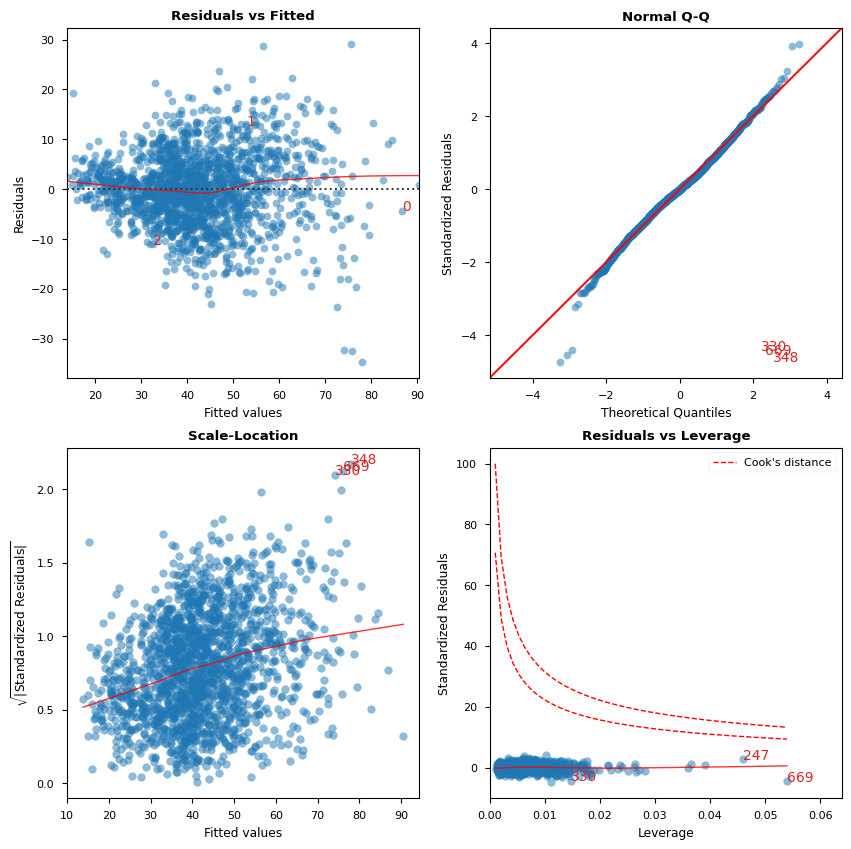

                        Features  VIF Factor
2        C(day_type)[T.Saturday]        1.04
3  C(day_type)[T.Sunday/Holiday]        1.04
9                          month        1.27
1               C(frost)[T.True]        1.35
5                      temp_diff        1.47
4                  humidity_lag1        1.94
8                      temp_lag1        2.14
6                 windspeed_lag1        2.47
7     np.log(peak_velocity_lag1)        2.50
0                      Intercept      110.77


In [65]:
diagnostics = Linear_Reg_Diagnostic(no2_model_diff)
diagnostics()
plt.show()

## PM10 im Verhältnis zu allen

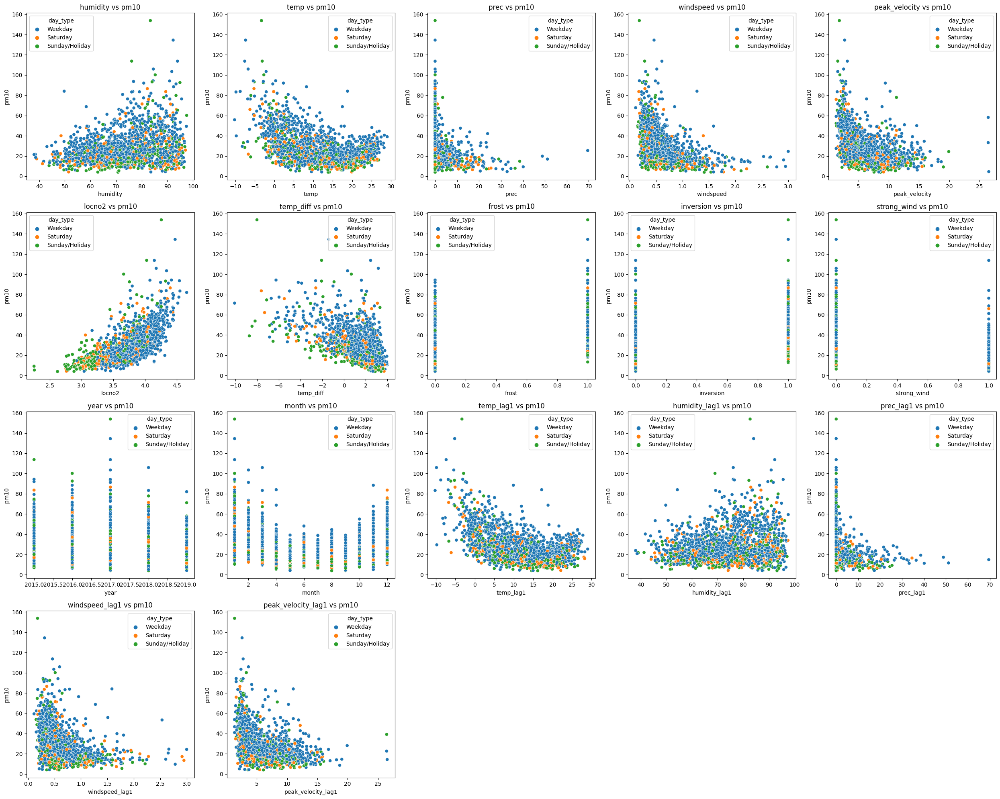

In [66]:
columns_to_plot = data1519.columns.drop(['no2', 'pm10', 'day_type', 'no2_fit', 'pm10_fit'])

# Calculate the number of rows needed for the subplots
num_plots = len(columns_to_plot)
num_rows = (num_plots + 4) // 5  # to have up to 5 plots per row

# Create a figure and a grid of subplots
fig, axs = plt.subplots(num_rows, 5, figsize=(25, 5 * num_rows))  # Adjust the figure size as needed

# Flatten the array of axes, for easy iteration
axs = axs.flatten()

# Counter for the current subplot
plot_number = 0

for column in columns_to_plot:
    # # Scatter plot for 'pm10'
    sns.scatterplot(x=data1519[column], y=data1519['pm10'], hue=data1519['day_type'], ax=axs[plot_number])
    axs[plot_number].set_title(f'{column} vs pm10')
    plot_number += 1  # Move to the next subplot

# If the last row is not completely filled, turn off the remaining axes
for i in range(plot_number, num_rows * 5):
    axs[i].axis('off')

plt.tight_layout()
plt.show()

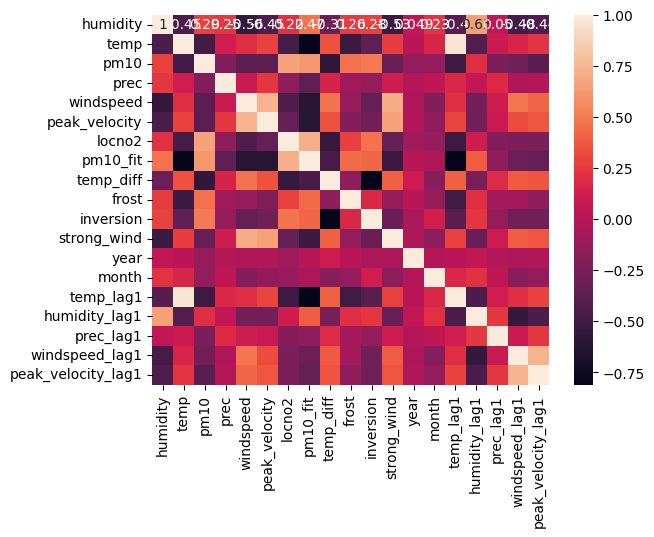

In [67]:
data1519nodaytype = data1519.drop(columns=['day_type', "no2", "no2_fit"])
correlation_matrix = data1519nodaytype.corr()
sns.heatmap(correlation_matrix, annot=True)
plt.show()

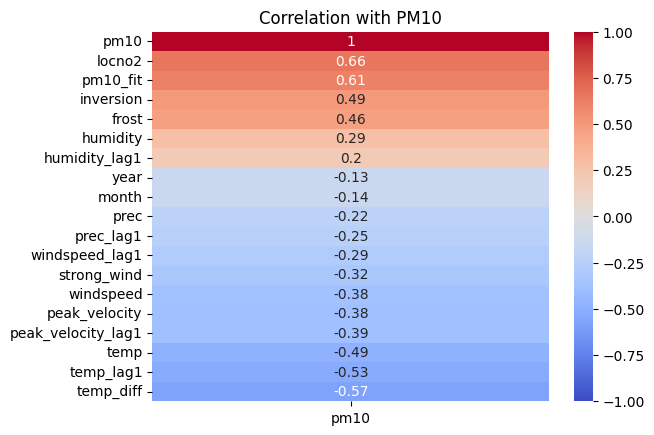

In [68]:
pm10_correlation = correlation_matrix[['pm10']].sort_values(by='pm10', ascending=False)

sns.heatmap(pm10_correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation with PM10")
plt.show()

# 5. Versuchen Sie, Ihr Modell durch eine Transformation der Response zu verbessern. Hier kann eine Wurzeltransformation hilfreich sein, also man modelliert √𝑌 , wobei hier 𝑌 die Response bezeichnet. Hilft das Ihrem Modell? Wie sieht es diagnostisch aus

## NO2 mit Wurzeltransformation

In [69]:
no2_model_diff = smf.ols(
        "np.sqrt(no2) ~  humidity_lag1 + temp_diff + windspeed_lag1 + np.log(peak_velocity_lag1) + temp_lag1 + C(frost) + month + C(day_type)",
        data=data1519).fit()

print(no2_model_diff.summary())

                            OLS Regression Results                            
Dep. Variable:           np.sqrt(no2)   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.735
Method:                 Least Squares   F-statistic:                     544.1
Date:                Tue, 27 Feb 2024   Prob (F-statistic):               0.00
Time:                        09:33:01   Log-Likelihood:                -1463.1
No. Observations:                1761   AIC:                             2946.
Df Residuals:                    1751   BIC:                             3001.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [70]:
sm.stats.anova_lm(no2_model_diff, typ=2)

,sum_sq,df,F,PR(>F)
C(frost),4.533086,1.0,14.612789,1.366336e-04
C(day_type),474.162787,2.0,764.252014,2.552521e-239
humidity_lag1,60.330949,1.0,194.481940,5.392752e-42
temp_diff,337.784104,1.0,1088.875757,4.182602e-186
windspeed_lag1,26.418181,1.0,85.161251,7.677438e-20
np.log(peak_velocity_lag1),2.357018,1.0,7.598047,5.903759e-03
temp_lag1,146.051586,1.0,470.809695,1.178736e-92
month,25.221667,1.0,81.304187,4.944715e-19
Residual,543.184071,1751.0,NaN,NaN


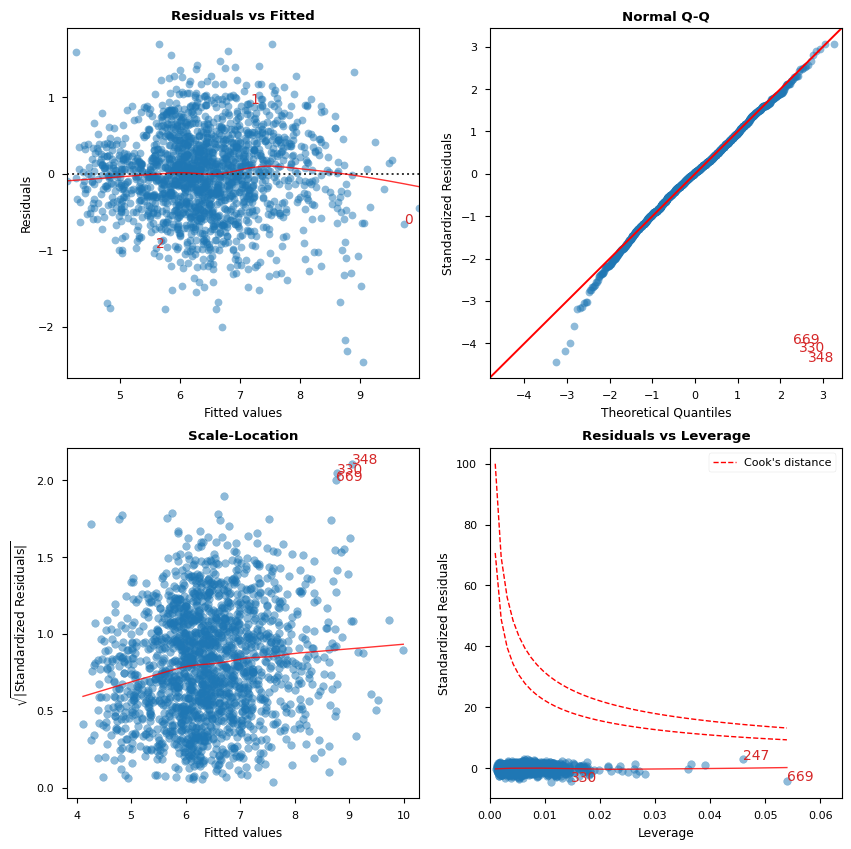

                        Features  VIF Factor
2        C(day_type)[T.Saturday]        1.04
3  C(day_type)[T.Sunday/Holiday]        1.04
9                          month        1.27
1               C(frost)[T.True]        1.35
5                      temp_diff        1.47
4                  humidity_lag1        1.94
8                      temp_lag1        2.14
6                 windspeed_lag1        2.47
7     np.log(peak_velocity_lag1)        2.50
0                      Intercept      110.77


In [71]:
diagnostics = Linear_Reg_Diagnostic(no2_model_diff)
diagnostics()
plt.show()

Insgesamt hat das Modell jetzt mit 73% (R2) eine recht gute Vorhersagekraft, die P-Values sind statistisch signifikant.

## PM10 mit Wurzeltransformation

In [72]:
pm10_model_diff = smf.ols(
        "np.sqrt(pm10) ~  humidity_lag1 + temp_diff + windspeed_lag1 + np.log(peak_velocity_lag1) + temp_lag1 + C(frost) + month + C(day_type)",
        data=data1519).fit()

print(pm10_model_diff.summary())

                            OLS Regression Results                            
Dep. Variable:          np.sqrt(pm10)   R-squared:                       0.619
Model:                            OLS   Adj. R-squared:                  0.617
Method:                 Least Squares   F-statistic:                     316.2
Date:                Tue, 27 Feb 2024   Prob (F-statistic):               0.00
Time:                        09:33:02   Log-Likelihood:                -2230.8
No. Observations:                1761   AIC:                             4482.
Df Residuals:                    1751   BIC:                             4536.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [73]:
sm.stats.anova_lm(pm10_model_diff, typ=2)

,sum_sq,df,F,PR(>F)
C(frost),140.399098,1.0,189.265878,5.726204e-41
C(day_type),194.380946,2.0,131.018222,9.438700e-54
humidity_lag1,59.048653,1.0,79.600905,1.127313e-18
temp_diff,454.816118,1.0,613.117699,2.644367e-116
windspeed_lag1,1.284582,1.0,1.731689,1.883676e-01
np.log(peak_velocity_lag1),104.947328,1.0,141.474898,1.983994e-31
temp_lag1,43.528801,1.0,58.679271,3.051413e-14
month,71.543648,1.0,96.444860,3.393749e-22
Residual,1298.907247,1751.0,NaN,NaN


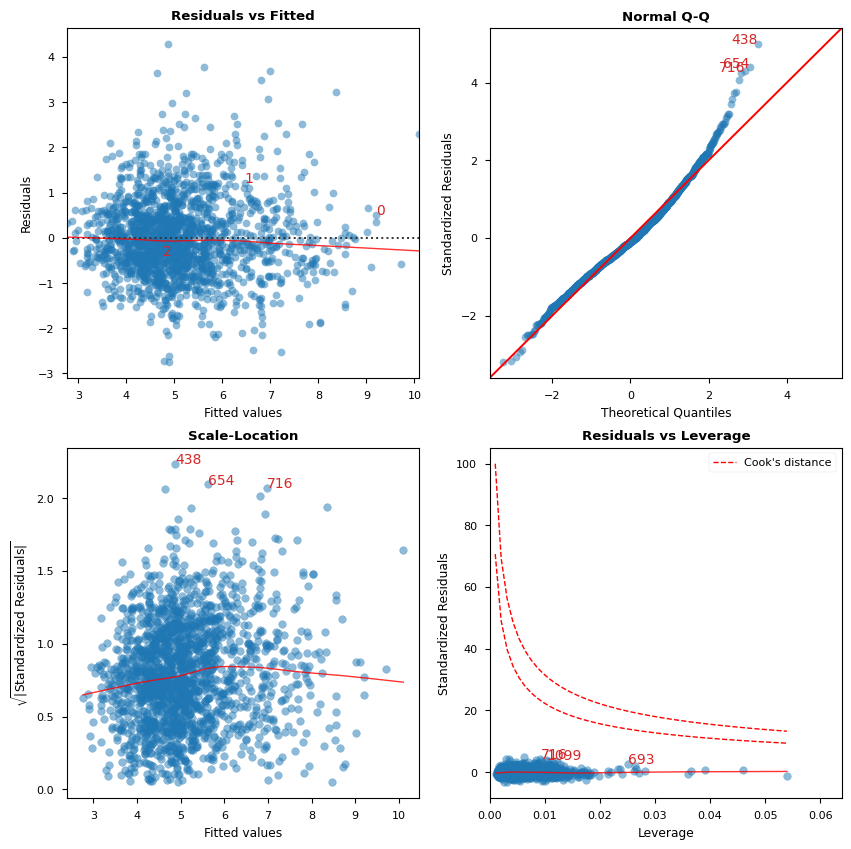

                        Features  VIF Factor
2        C(day_type)[T.Saturday]        1.04
3  C(day_type)[T.Sunday/Holiday]        1.04
9                          month        1.27
1               C(frost)[T.True]        1.35
5                      temp_diff        1.47
4                  humidity_lag1        1.94
8                      temp_lag1        2.14
6                 windspeed_lag1        2.47
7     np.log(peak_velocity_lag1)        2.50
0                      Intercept      110.77


In [74]:
diagnostics = Linear_Reg_Diagnostic(pm10_model_diff)
diagnostics()
plt.show()

Insgesamt hat das Modell jetzt mit run 62% (R2) eine gute Vorhersagekraft, die P-Values sind statistisch signifikant.

# 6. Wenn Sie mit Ihrem Modell zufrieden sind, verwenden Sie dieses, um eine Vorhersage für das Jahr 2020 zu treffen. Verwenden Sie dazu die Prädiktor-Information aus dem Jahr 2020 und ermitteln Sie die fitted values.

In [75]:
# first get the data for 2020
data20 = data[data.index.year == 2020]
data20 = data20.dropna()

In [76]:
# now make all transformations for 2020 too

# bring in kalkleiten data
datakalk20 = datakalk[datakalk.index.year == 2020]
merged_data = pd.merge(data20, datakalk20[['temp']], left_index=True, right_index=True, suffixes=('_data20', '_datakalk20'))
merged_data['temp_diff'] = merged_data['temp_data20'] - merged_data['temp_datakalk20']
data20['temp_diff'] = merged_data['temp_diff']    

# new values
data20['frost'] = data20['temp'] < 0
data20['inversion'] = data20['temp_diff'] < 0
data20['strong_wind'] = data20['windspeed'] > 0.6
data20['year'] = data20.index.year
data20['month'] = data20.index.month

# lagged values
data20['temp_lag1'] = data20['temp'].shift(1)
data20['humidity_lag1'] = data20['humidity'].shift(1)
data20['prec_lag1'] = data20['prec'].shift(1)
data20['windspeed_lag1'] = data20['windspeed'].shift(1)
data20['peak_velocity_lag1'] = data20['peak_velocity'].shift(1)
data20.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 361 entries, 2020-01-01 00:00:00+00:00 to 2020-12-31 00:00:00+00:00
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   day_type            361 non-null    category
 1   humidity            361 non-null    float64 
 2   temp                361 non-null    float64 
 3   no2                 361 non-null    float64 
 4   pm10                361 non-null    float64 
 5   prec                361 non-null    float64 
 6   windspeed           361 non-null    float64 
 7   peak_velocity       361 non-null    float64 
 8   temp_diff           359 non-null    float64 
 9   frost               361 non-null    bool    
 10  inversion           361 non-null    bool    
 11  strong_wind         361 non-null    bool    
 12  year                361 non-null    int32   
 13  month               361 non-null    int32   
 14  temp_lag1           360 non-null    float

## NO2 Vorhersage

In [77]:
predictions = no2_model_diff.predict(data20)
predictions.info()

<class 'pandas.core.series.Series'>
DatetimeIndex: 361 entries, 2020-01-01 00:00:00+00:00 to 2020-12-31 00:00:00+00:00
Series name: None
Non-Null Count  Dtype  
--------------  -----  
358 non-null    float64
dtypes: float64(1)
memory usage: 13.7 KB


In [78]:
predictions

DateTime
2020-01-01 00:00:00+00:00         NaN
2020-01-02 00:00:00+00:00    9.652373
2020-01-03 00:00:00+00:00    9.502308
2020-01-04 00:00:00+00:00    8.014731
2020-01-05 00:00:00+00:00    5.781792
                               ...   
2020-12-27 00:00:00+00:00    5.877641
2020-12-28 00:00:00+00:00    7.242888
2020-12-29 00:00:00+00:00    7.298315
2020-12-30 00:00:00+00:00    6.862884
2020-12-31 00:00:00+00:00    6.898020
Length: 361, dtype: float64

In [79]:
data20['predicted_no2'] = np.square(predictions)

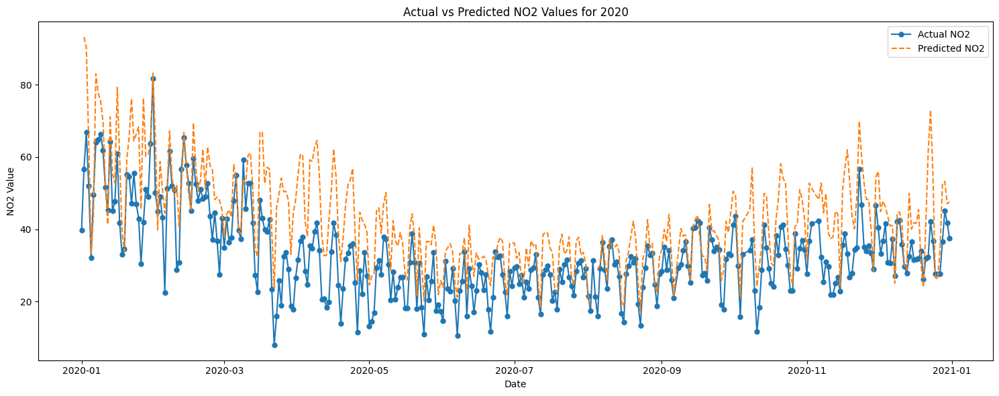

In [80]:
data20.index = pd.to_datetime(data20.index)

plt.figure(figsize=(15, 6))
plt.plot(data20.index, data20['no2'], label='Actual NO2', marker='o', linestyle='-', markersize=5)
plt.plot(data20.index, data20['predicted_no2'], label='Predicted NO2', marker='', linestyle='--')
plt.title('Actual vs Predicted NO2 Values for 2020')
plt.xlabel('Date')
plt.ylabel('NO2 Value')
plt.legend()
plt.tight_layout()
plt.show()

## PM10 Vorhersage

In [81]:
predictions = pm10_model_diff.predict(data20)
predictions.info()

<class 'pandas.core.series.Series'>
DatetimeIndex: 361 entries, 2020-01-01 00:00:00+00:00 to 2020-12-31 00:00:00+00:00
Series name: None
Non-Null Count  Dtype  
--------------  -----  
358 non-null    float64
dtypes: float64(1)
memory usage: 13.7 KB


In [82]:
data20['predicted_pm10'] = np.square(predictions)

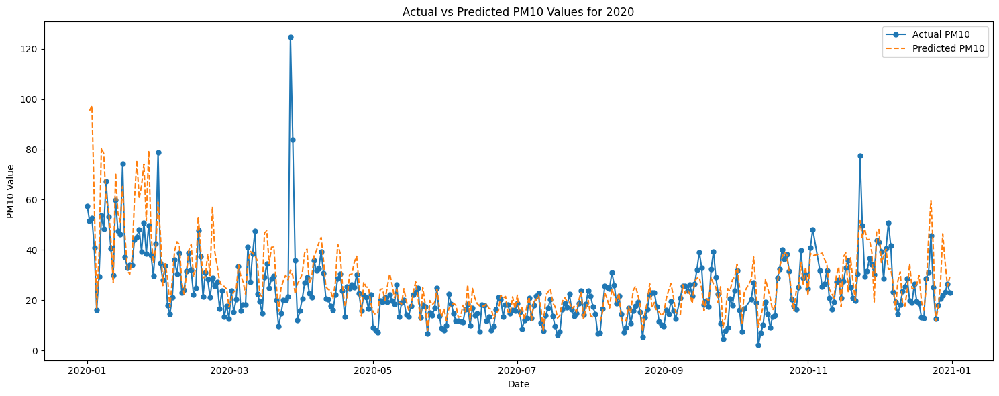

In [83]:
data20.index = pd.to_datetime(data20.index)

plt.figure(figsize=(15, 6))
plt.plot(data20.index, data20['pm10'], label='Actual PM10', marker='o', linestyle='-', markersize=5)
plt.plot(data20.index, data20['predicted_pm10'], label='Predicted PM10', marker='', linestyle='--')
plt.title('Actual vs Predicted PM10 Values for 2020')
plt.xlabel('Date')
plt.ylabel('PM10 Value')
plt.legend()
plt.tight_layout()
plt.show()

# 7. Vergleichen Sie Ihre Vorhersage für 2020 mit den wahren Werten aus 2020 in einem passenden Plot über die ersten 6 Monate. Was ist hier passiert? Haben Sie eine Interpretation für das Phänomen? (Tipp: Remember Covid? Suchen Sie sich die genauen Daten der Lockdowns und ersten Lockerungen heraus und zeichnen Sie diese in Ihrer Darstellung ein.)

In [84]:
# We only need the first six months
data20_first_six_months = data20[data20.index.month <= 6]

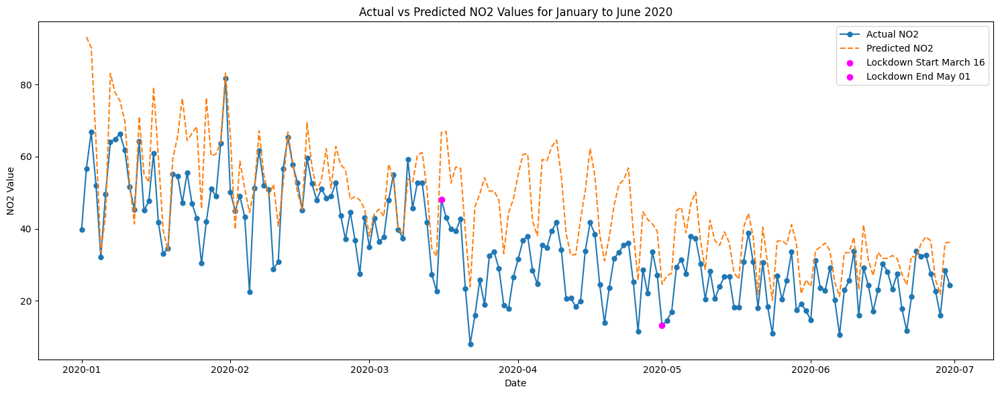

In [85]:
plt.figure(figsize=(15, 6))
plt.plot(data20_first_six_months.index, data20_first_six_months['no2'], label='Actual NO2', marker='o', linestyle='-', markersize=5)
plt.plot(data20_first_six_months.index, data20_first_six_months['predicted_no2'], label='Predicted NO2', marker='', linestyle='--')

march_16 = mdates.date2num(pd.to_datetime('2020-03-16'))
may_01 = mdates.date2num(pd.to_datetime('2020-05-01'))

march_16_value = data20_first_six_months.loc['2020-03-16', 'no2'] if '2020-03-16' in data20_first_six_months.index else None
may_01_value = data20_first_six_months.loc['2020-05-01', 'no2'] if '2020-05-01' in data20_first_six_months.index else None

if march_16_value is not None:
    plt.scatter(march_16, march_16_value, color='magenta', label='Lockdown Start March 16', zorder=5)
if may_01_value is not None:
    plt.scatter(may_01, may_01_value, color='magenta', label='Lockdown End May 01', zorder=5)

plt.title('Actual vs Predicted NO2 Values for January to June 2020')
plt.xlabel('Date')
plt.ylabel('NO2 Value')
plt.legend()
plt.tight_layout()
plt.show()

Das Modell sagt höhere NO2 Werte voraus als sie in Wirklichkeit gemessen wurden. Das liegt an den Corona Lockdown Maßnahmen die für eine Verringerung der Schadstoffwerte gesorgt haben.


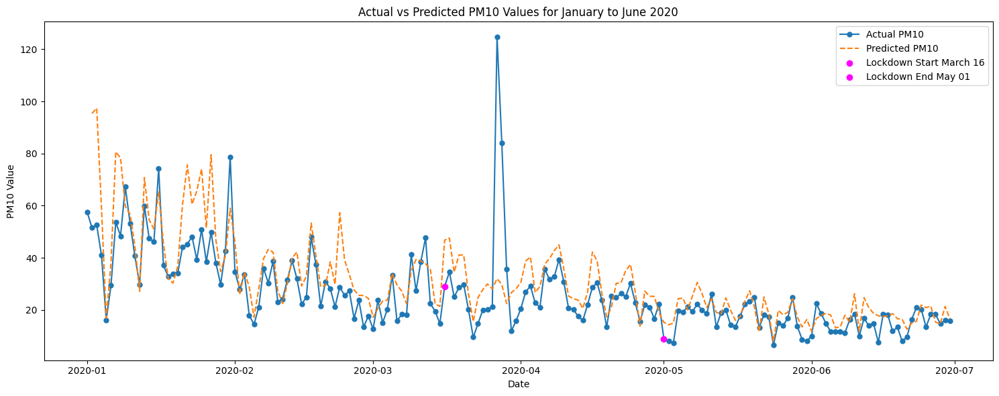

In [86]:
plt.figure(figsize=(15, 6))
plt.plot(data20_first_six_months.index, data20_first_six_months['pm10'], label='Actual PM10', marker='o', linestyle='-', markersize=5)
plt.plot(data20_first_six_months.index, data20_first_six_months['predicted_pm10'], label='Predicted PM10', marker='', linestyle='--')

march_16 = mdates.date2num(pd.to_datetime('2020-03-16'))
may_01 = mdates.date2num(pd.to_datetime('2020-05-01'))

march_16_value = data20_first_six_months.loc['2020-03-16', 'pm10'] if '2020-03-16' in data20_first_six_months.index else None
may_01_value = data20_first_six_months.loc['2020-05-01', 'pm10'] if '2020-05-01' in data20_first_six_months.index else None

if march_16_value is not None:
    plt.scatter(march_16, march_16_value, color='magenta', label='Lockdown Start March 16', zorder=5)
if may_01_value is not None:
    plt.scatter(may_01, may_01_value, color='magenta', label='Lockdown End May 01', zorder=5)

plt.title('Actual vs Predicted PM10 Values for January to June 2020')
plt.xlabel('Date')
plt.ylabel('PM10 Value')
plt.legend()
plt.tight_layout()
plt.show()

Der Ausschlag in den gemessenen PM10 Werten ist auf den Saharastaubzeitraum zurück zu führen.